# Image Processing with Python (Python)

In [1]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Image Processing with Python/"  # see folders

In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
# chapter 1 (Introduction)
from skimage import data, color
from skimage.filters import threshold_otsu, threshold_local, try_all_threshold

# chapter 2 + (Filters, Contrast, Transformation and Morphology)
from skimage.filters import sobel, gaussian
from skimage import exposure
from skimage.transform import rotate, rescale, resize
from skimage import morphology

# chapter 3 + (Image restoration, Noise, Segmentation and Contours)
from skimage.restoration import inpaint, denoise_tv_chambolle, denoise_bilateral
from skimage.util import random_noise
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage import measure   

# chapter 4 + (Advanced Operations, Detecting Faces and Features)
from skimage.feature import canny
from skimage.feature import corner_harris, corner_peaks
from skimage.feature import Cascade
import matplotlib.patches
from skimage.filters import gaussian


In [4]:
# view images
def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

# plot 1 image
def plot_1(image1, left=0, bottom=0, right=1, top=1, wspace=0, hspace=0, format_img=".jpg"):
    image = plt.imread(data_folder + (image1+format_img))
    plt.axis('off')
    plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 2 images horizontally
def plot_2(image1, image2, left=0, bottom=0, right=2.2, top=1, wspace=0, hspace=0.05, format_img=".jpg"):
    plt.subplot(1, 2, 1)
    image = plt.imread(data_folder + (image1+format_img))
    plt.axis('off')
    plt.imshow(image)
    plt.subplot(1, 2, 2)
    image = plt.imread(data_folder + (image2+format_img))
    plt.axis('off')
    plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 3 images horizontally
def plot_3(image1, image2, image3, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 3, 1)
    imagem = plt.imread(data_folder + (image1+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplot(1, 3, 2)
    imagem = plt.imread(data_folder + (image2+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplot(1, 3, 3)
    imagem = plt.imread(data_folder + (image3+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()
    
# plot 4 images horizontally
def plot_4(image1, image2, image3, image4, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 4, 1)
    imagem = plt.imread(data_folder + (image1+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplot(1, 4, 2)
    imagem = plt.imread(data_folder + (image2+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplot(1, 4, 3)
    imagem = plt.imread(data_folder + (image3+format_img))
    plt.axis('off')
    plt.imshow(imagem)
    plt.subplot(1, 4, 4)
    imagem = plt.imread(data_folder + (image4+format_img))
    plt.axis('off')
    plt.imshow(imagem)    
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

##    CHAPTER 1  - Introducing Image Processing and scikit-image


Jump into digital image structures and learn to process them. Extract data, transform and analyze images using NumPy and Scikit-image. With just a few lines of code, you will convert RGB images to grayscale, get data from them, obtain histograms containing very useful information, and separate objects from the background.

In [5]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Image Processing with Python/chapter 1/"

#### Exercício 1 - Make images come alive with scikit-image

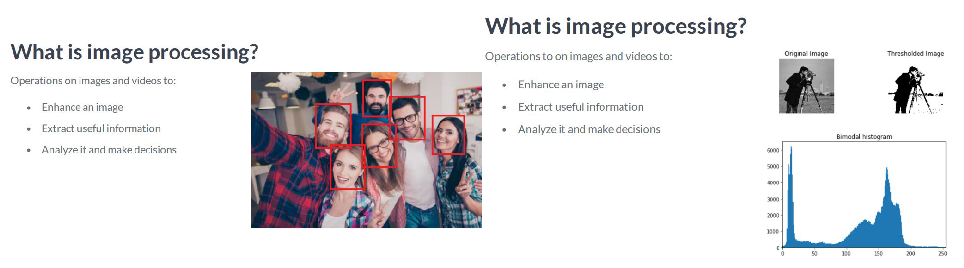

Image processing is a subset of computer vision.


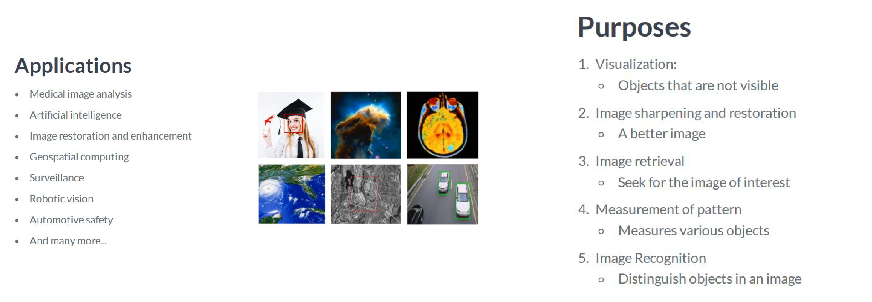

scikit-image: image processing in Python. 
- Easy to use
- Makes use of machine learning
- out of the box complex algorithms


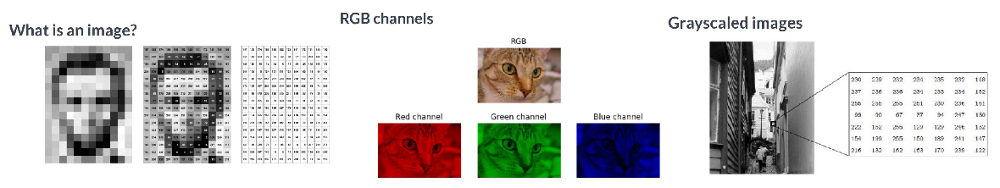

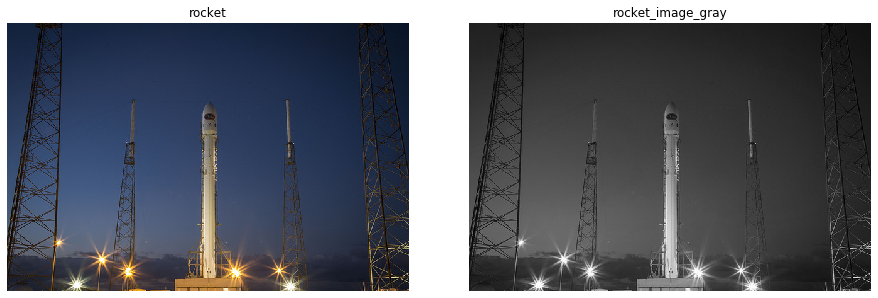

In [6]:
#vídeo

# Visualizing images in the course (Don't worry about Matplotlib)
def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
#     plt.show()
    
#####################################################################################################

plot_2('image_processing', 'image_processing_2')
print("Image processing is a subset of computer vision.")
plot_2('applications', 'purposes')
print("""scikit-image: image processing in Python. 
- Easy to use
- Makes use of machine learning
- out of the box complex algorithms""")
plot_3('what_image', 'RGB', 'grayscaled')

from skimage import data

rocket_image = data.rocket()

# use previous defined function to show images
plt.subplot(1, 2, 1)
show_image(rocket_image, title='rocket')

from skimage import color

grayscale = color.rgb2gray(rocket_image)
rgb = color.gray2rgb(grayscale)

# gray image
plt.subplot(1, 2, 2)
show_image(rgb, title='rocket_image_gray')

plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.15, hspace=0.15)
plt.show()

Exercício 2

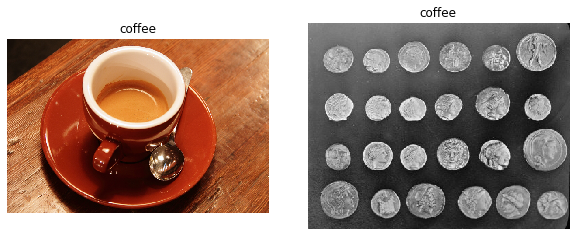

(400, 600, 3)
(303, 384)

coins_image has a shape of (303, 384), grayscale. And coffee_image (400, 600, 3), RGB-3.

The coffee image is RGB-3 colored, that's why it has a 3 at the end, when displaying the shape (H, W, D) of it. The coins
image is grayscale and has a single color channel.


In [7]:
# Is this gray or full of color?

from skimage import data

coffee_image = data.coffee()
coins_image = data.coins()

# Whats the main difference between the images shown below?

plt.subplot(1, 2, 1)
show_image(coffee_image, 'coffee')
plt.subplot(1, 2, 2)
show_image(coins_image, 'coffee')
plt.subplots_adjust(left=0, bottom=0, right=1.3, top=1, wspace=0.15, hspace=0.15)
plt.show()

print(coffee_image.shape)
print(coins_image.shape)

print("""\ncoins_image has a shape of (303, 384), grayscale. And coffee_image (400, 600, 3), RGB-3.

The coffee image is RGB-3 colored, that's why it has a 3 at the end, when displaying the shape (H, W, D) of it. The coins
image is grayscale and has a single color channel.""")

Exercício 3

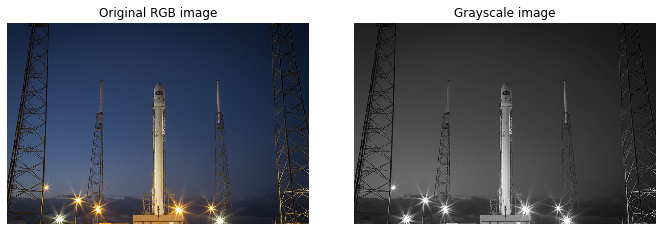

For many applications of image processing, color information doesn't help us identify important edges or other
features. Something that we will cover later in the course.


In [8]:
# RGB to grayscale

# Import the modules from skimage
from skimage import data, color

# Load the rocket image
rocket = data.rocket()

# Convert the image to grayscale
gray_scaled_rocket = color.rgb2gray(rocket)

# Show the original image
plt.subplot(1, 2, 1)
show_image(rocket, 'Original RGB image')

# Show the grayscale image
plt.subplot(1, 2, 2)
show_image(gray_scaled_rocket, 'Grayscale image')

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.15, hspace=0.15)
plt.show()
print("""For many applications of image processing, color information doesn't help us identify important edges or other
features. Something that we will cover later in the course.""")

#### Exercício 4 - NumPy for images

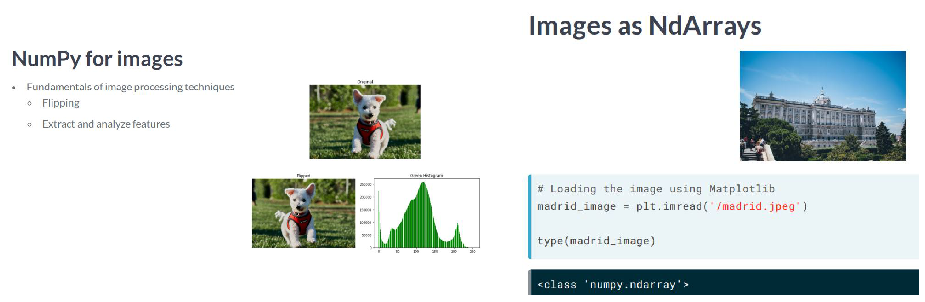

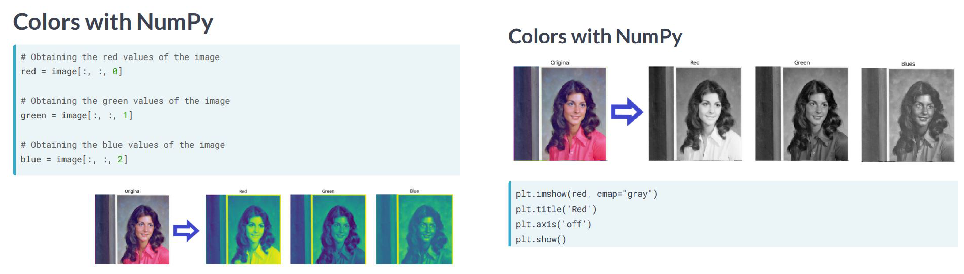

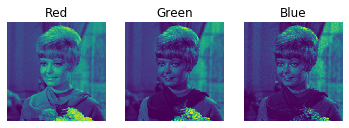

'Red' image --> Shape: (256, 256); size: 65536 



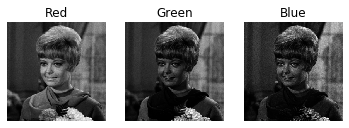

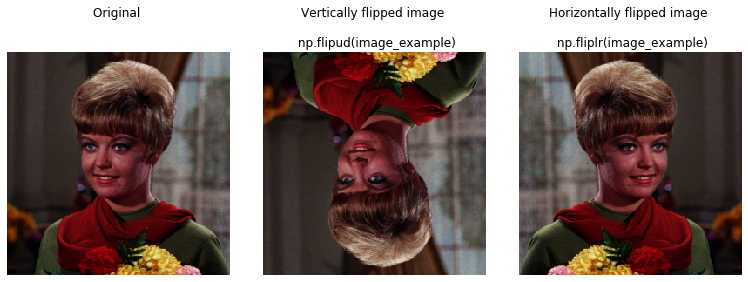

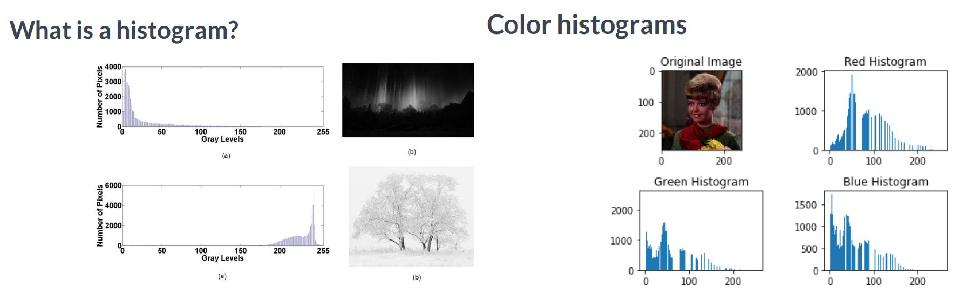

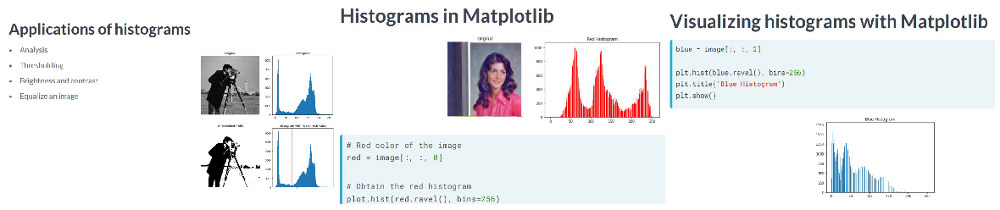

In [9]:
#vídeo

plot_2('numpy_images', 'madrid')

plot_2('colors_1', 'colors_2', wspace=0.1)

image_example = plt.imread(data_folder + "4.1.01.tiff")

red = image_example[:, :, 0]     # Obtaining the red values of the image
green = image_example[:, :, 1]    # Obtaining the green values of the image
blue = image_example[:, :, 2]    # Obtaining the blue values of the image

plt.subplot(1, 3, 1)
show_image(red, 'Red', cmap_type=None)
plt.subplot(1, 3, 2)
show_image(green, 'Green', cmap_type=None)
plt.subplot(1, 3, 3)
show_image(blue, 'Blue', cmap_type=None)
plt.show()

# shape and size
print("""'Red' image --> Shape: {}; size: {} \n""".format(red.shape, red.size))

plt.subplot(1, 3, 1)
show_image(red, 'Red')
plt.subplot(1, 3, 2)
show_image(green, 'Green')
plt.subplot(1, 3, 3)
show_image(blue, 'Blue')
plt.show()

#######################################################################

plt.subplot(1, 3, 1)
show_image(image_example, 'Original \n\n')

# --> Flipping images: vertically

# Flip the image in up direction
vertically_flipped = np.flipud(image_example)

plt.subplot(1, 3, 2)
show_image(vertically_flipped, """Vertically flipped image \n\n np.flipud(image_example)""")

# --> Flipping images: horizontally

# Flip the image in left direction
horizontally_flipped = np.fliplr(image_example)

plt.subplot(1, 3, 3)
show_image(horizontally_flipped, 'Horizontally flipped image \n\n np.fliplr(image_example)')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.15, hspace=0.15)
plt.show()

#########################################################

plot_2('histogram', 'color_histograms')

plot_3('applications_histogram', 'histograms_matplotlib', 'visualizing_histograms')


Exercício 5

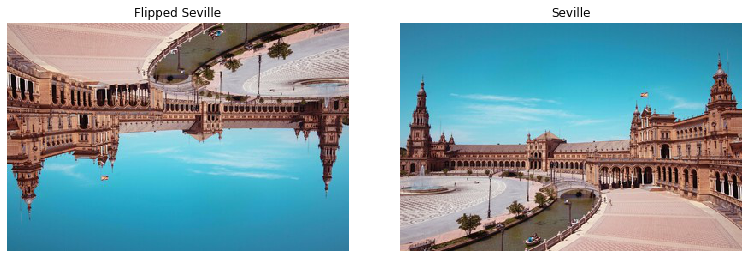

In [10]:
# Flipping out

flipped_seville = plt.imread(data_folder + "flipped_seville.JPG")

# Flip the image vertically
seville_vertical_flip = np.flipud(flipped_seville)

# Flip the image horizontally
seville_horizontal_flip = np.fliplr(seville_vertical_flip)

# The original, flipped image
plt.subplot(1, 2, 1)
show_image(flipped_seville, 'Flipped Seville')

# Show the resulting image
plt.subplot(1, 2, 2)
show_image(seville_horizontal_flip, 'Seville')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.15, hspace=0.15)
plt.show()

Exercício 6

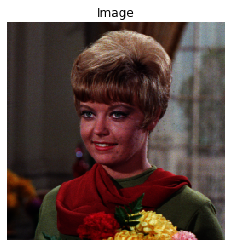

In [11]:
# Histograms

# Extracting information from images is a fundamental part of image enhancement. This way you can balance the red and blue 
# to make the image look colder or warmer.

# You will use hist() to display the 256 different intensities of the red color. And ravel() to make these color values an
# array of one flat dimension.

image = plt.imread(data_folder + "4.1.01.tiff")

show_image(image)
plt.show()

##############################################################

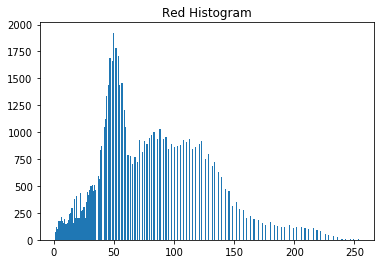

With this histogram we see that the image is quite reddish, meaning it has a sensation of warmness. This is 
because it has a wide and large distribution of bright red pixels, from 0 to around 150.


In [12]:
# Obtain the red channel
red_channel = image[:, :, 0]

# Plot the red histogram with bins in a range of 256
plt.hist(red_channel.ravel(), bins=256)

plt.title('Red Histogram')
plt.show()

print("""With this histogram we see that the image is quite reddish, meaning it has a sensation of warmness. This is 
because it has a wide and large distribution of bright red pixels, from 0 to around 150.""")

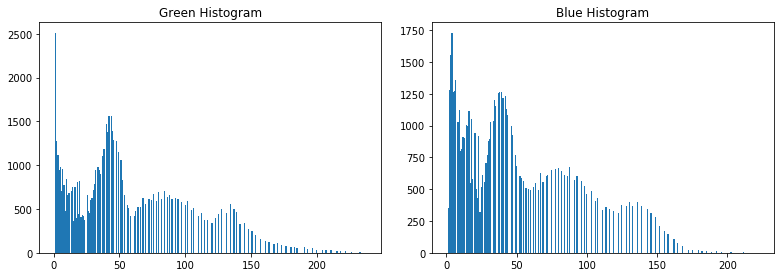

In [13]:
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

plt.subplot(1, 2, 1)
plt.hist(green_channel.ravel(), bins=256)
plt.title('Green Histogram')
plt.subplot(1, 2, 2)
plt.hist(blue_channel.ravel(), bins=256)
plt.title('Blue Histogram')

plt.subplots_adjust(left=0, bottom=0.2, right=1.7, top=1, wspace=0.15, hspace=0.15)
plt.show()

#### Exercício 7 - Getting started with thresholding

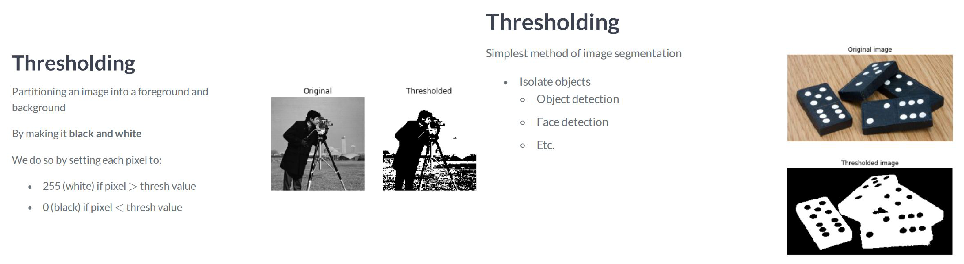

Thresholding: works best from grayscale images


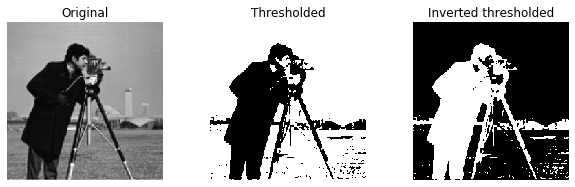


Categories: Global or Local


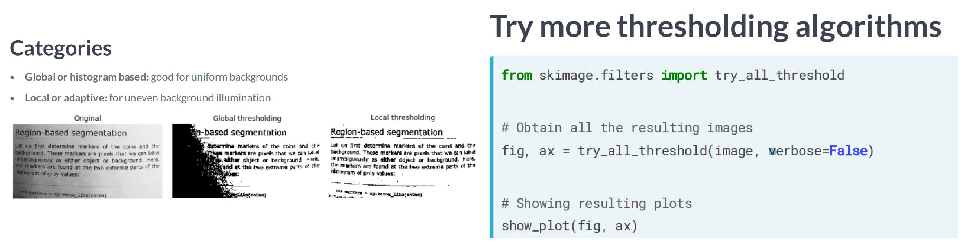

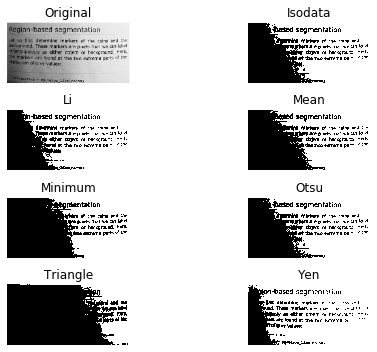


Optimal threshold value: Global ---> Uniform background


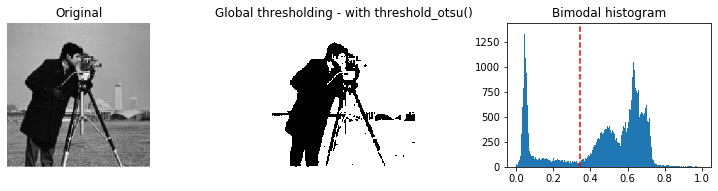


Optimal threshold value: Local --> Uneven background


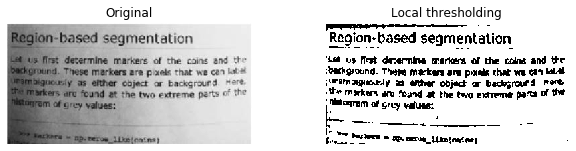

In [14]:
#vídeo

plot_2('thresholding', 'thresholding_2')
print("Thresholding: works best from grayscale images")

threshold_image = plt.imread(data_folder + "threshold_image.jpg")
threshold_image_gray = color.rgb2gray(threshold_image)

# Obtain the optimal threshold value
thresh = 0.4

# Apply thresholding to the image
binary = threshold_image_gray > thresh

# Show the original 
plt.subplot(1, 3, 1)
show_image(threshold_image_gray, 'Original')

# Show the thresholded
plt.subplot(1, 3, 2)
show_image(binary, 'Thresholded')

inverted_binary = threshold_image_gray <= thresh

# Show the inverted thresholded
plt.subplot(1, 3, 3)
show_image(inverted_binary, 'Inverted thresholded')

plt.subplots_adjust(left=0, bottom=0, right=1.3, top=1, wspace=0.3, hspace=0.15)
plt.show()

########################################################################

print("""\nCategories: Global or Local""")
plot_2('categories', 'thresholding_algorithms')

from skimage.filters import try_all_threshold

text_image = color.rgb2gray(plt.imread(data_folder + "text_categories_image.jpg"))

# Obtain all the resulting images
fig, ax = try_all_threshold(text_image, verbose=False)
plt.show()

########################################################################
print("=====================================================================================================\n")

print("""Optimal threshold value: Global ---> Uniform background""")

# Optimal threshold value: Global ---> Uniform background

# Import the otsu threshold function
from skimage.filters import threshold_otsu

# Obtain the optimal threshold value
thresh = threshold_otsu(threshold_image_gray)

# Apply thresholding to the image
binary_global = threshold_image_gray > thresh

# Show the original and binarized image - and histogram with the optimal value
plt.subplot(1, 3, 1)
show_image(threshold_image, 'Original') 

plt.subplot(1, 3, 2)
show_image(binary_global, 'Global thresholding - with threshold_otsu()')

plt.subplot(1, 3, 3)
plt.hist(threshold_image_gray.ravel(), bins=256)
plt.title('Bimodal histogram')
plt.axvline(x=thresh, color='red', linestyle='--')   # optimal value on the red line

plt.subplots_adjust(left=0, bottom=0.5, right=1.7, top=1, wspace=0.3, hspace=0.15)
plt.show()

##
print("=====================================================================================================\n")

print("""Optimal threshold value: Local --> Uneven background""")

# Import the local threshold function
from skimage.filters import threshold_local

# Set the block size to 35
block_size = 35

# Obtain the optimal local thresholding
local_thresh = threshold_local(text_image, block_size, offset=0.03)

# Apply local thresholding and obtain the binary image
binary_local = text_image > local_thresh

# Show the original and binarized image
plt.subplot(1, 2, 1)
show_image(text_image, 'Original')

plt.subplot(1, 2, 2)
show_image(binary_local, 'Local thresholding')

plt.subplots_adjust(left=0, bottom=0.4, right=1.3, top=1, wspace=0.3, hspace=0.15)
plt.show()


Exercício 8

Otsu's method:

- https://en.wikipedia.org/wiki/Otsu%27s_method

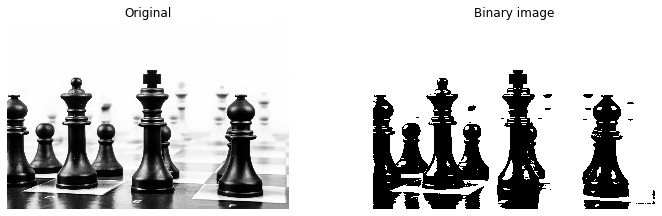

In [15]:
# Apply global thresholding

chess_pieces_image = plt.imread(data_folder + "bw.jpg") 

# Import the otsu threshold function
from skimage.filters import threshold_otsu

# Make the image grayscale using rgb2gray
chess_pieces_image_gray = color.rgb2gray(chess_pieces_image)

# Obtain the optimal threshold value with otsu
thresh = threshold_otsu(chess_pieces_image_gray)

# Apply thresholding to the image
binary = chess_pieces_image_gray > thresh

# Show the image
plt.subplot(1, 2, 1)
show_image(chess_pieces_image, 'Original')
plt.subplot(1, 2, 2)
show_image(binary, 'Binary image')

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.3, hspace=0.15)
plt.show()

Exercício 9

threshold_local

https://scikit-image.org/docs/dev/api/skimage.filters.html#skimage.filters.threshold_local

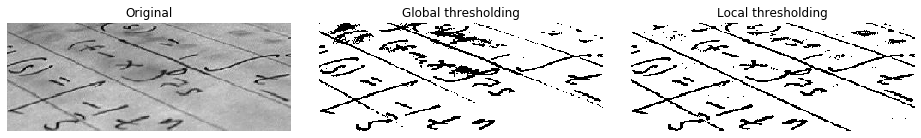

Now you know that you should use local thresholding instead of global if the image has a wide variation of 
background intensity.


Global treshold: 0.5326286764705882

Local treshold: [[0.51083104 0.51117182 0.51181608 ... 0.62260604 0.6229979  0.62319634]
 [0.51037741 0.51071575 0.51135525 ... 0.62228206 0.62266598 0.62286039]
 [0.50949543 0.50982848 0.51045767 ... 0.62164101 0.62200806 0.62219389]
 ...
 [0.65801157 0.65809508 0.65825747 ... 0.62972532 0.6297996  0.62984165]
 [0.65790325 0.65798914 0.65815603 ... 0.63002477 0.63007831 0.6301096 ]
 [0.65784293 0.6579301  0.65809936 ... 0.63017865 0.63022134 0.630247  ]]


In [16]:
# When the background isn't that obvious (uneven)

page_image = plt.imread(data_folder + "page_image.jpg")  
page_image_gray = color.rgb2gray(page_image)  # adaptei para ficar igual

plt.subplot(1, 3, 1)
show_image(page_image, 'Original')

# In this exercise, you will compare both types of thresholding methods (global and local), to find the optimal way to 
# obtain the binary image we need.

##################

# 1) Otsu threshold

# Import the otsu threshold function
from skimage.filters import threshold_otsu

# Obtain the optimal otsu global thresh value
global_thresh = threshold_otsu(page_image_gray)

# Obtain the binary image by applying global thresholding
binary_global = page_image_gray > global_thresh

# Show the binary image obtained
plt.subplot(1, 3, 2)
show_image(binary_global, 'Global thresholding')


##################

# 2) Local threshold

# Import the local threshold function
from skimage.filters import threshold_local

# Set the block size to 35
block_size = 35  # Odd size of pixel neighborhood which is used to calculate the threshold value (e.g. 3, 5, 7, …).

# Obtain the optimal local thresholding
local_thresh = threshold_local(page_image_gray, block_size, offset=0.06)  # defini eu outro valor para o offset

# Obtain the binary image by applying local thresholding
binary_local = page_image_gray > local_thresh

# Show the binary image
plt.subplot(1, 3, 3)
show_image(binary_local, 'Local thresholding')

plt.subplots_adjust(left=0, bottom=-1, right=2.1, top=1, wspace=0.1, hspace=0)
plt.show()

print("""Now you know that you should use local thresholding instead of global if the image has a wide variation of 
background intensity.

===================================================================================================================\n""")

print("Global treshold: {}\n".format(global_thresh))
print("Local treshold: {}".format(local_thresh))

Exercício 10

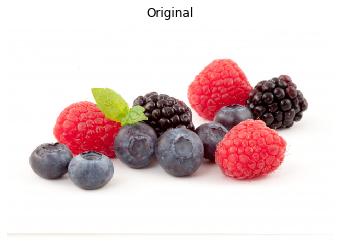

Not being sure about what thresholding method to use isn't a problem. Trying multiple methods:


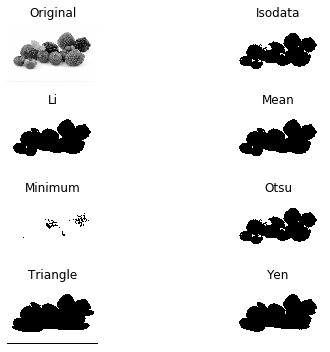

This image works well with some global thresholding methods (like the "Yen" and "Mean") and not so well in others,
(like the "Minimum").


In [17]:
# Trying other methods

# Not being sure about what thresholding method to use isn't a problem. In fact, scikit-image provides us with a function 
# to check multiple methods and see for ourselves what the best option is. It returns a figure comparing the outputs of 
# different global thresholding methods.

fruits_image = plt.imread(data_folder + "fruits-2.jpg")

show_image(fruits_image, 'Original')
plt.show()

print("Not being sure about what thresholding method to use isn't a problem. Trying multiple methods:")

# Import the try all function
from skimage.filters import try_all_threshold

# Import the rgb to gray convertor function 
from skimage.color import rgb2gray

# Turn the fruits image to grayscale
grayscale = rgb2gray(fruits_image)

# Use the try all method on the grayscale image
fig, ax = try_all_threshold(grayscale, verbose=False)

# Show the resulting plots
plt.show()

print("""This image works well with some global thresholding methods (like the "Yen" and "Mean") and not so well in others,
(like the "Minimum").""")

Exercício 11

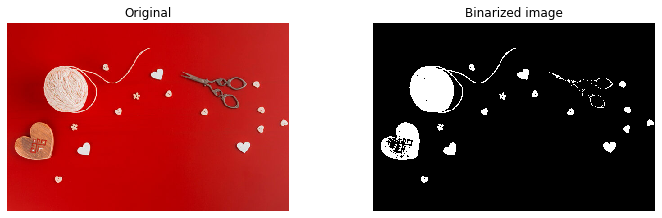

By using a global thresholding method, you obtained the precise binarized image. If you would have used local 
instead nothing would have been segmented.


In [18]:
# Apply thresholding

tools_image = plt.imread(data_folder + "shapes52.jpg")

plt.subplot(1, 2, 1)
show_image(tools_image, 'Original')

# Import threshold and gray convertor functions
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray

# Turn the image grayscale
tools_image = rgb2gray(tools_image)

# Obtain the optimal thresh
thresh = threshold_otsu(tools_image)

# Obtain the binary image by applying thresholding
binary_image = tools_image > thresh

# Show the resulting binary image
plt.subplot(1, 2, 2)
show_image(binary_image, 'Binarized image')

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.3, hspace=0.15)
plt.show()

print("""By using a global thresholding method, you obtained the precise binarized image. If you would have used local 
instead nothing would have been segmented.""")

# CHAPTER 2 - Filters, Contrast, Transformation and Morphology

You will learn to **detect object shapes** using edge detection filters, **improve medical images** with contrast enhancement **and even enlarge pictures to five times its original size**. You will also apply morphology to **make thresholding more accurate** when segmenting images and go to the next level of processing images with Python.

In [19]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Image Processing with Python/chapter 2/"

#### Exercício 1 - Jump into filtering

Gaussian filtering

https://scikit-image.org/docs/dev/api/skimage.filters.html#skimage.filters.gaussian

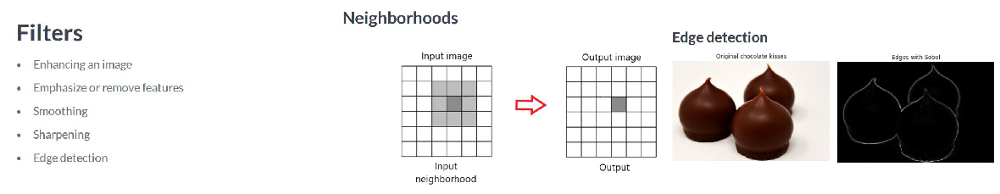

Edge detection (with sobel):


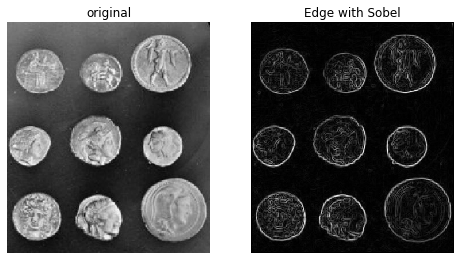

Gaussian Smoothing:


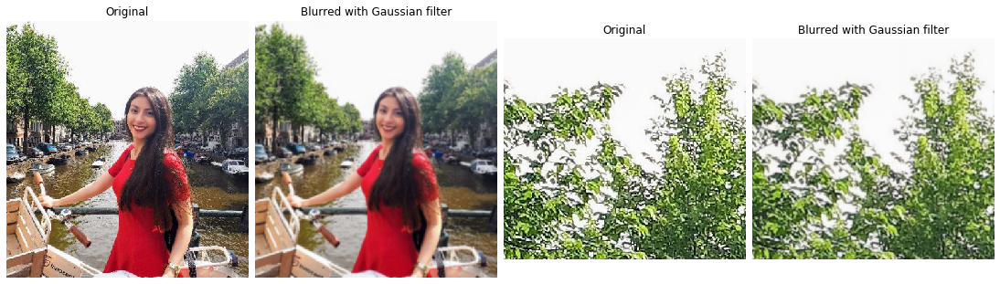

In [20]:
#vídeo

def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 6), sharex=True, sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

plot_3('filters', 'neighborhoods', 'edge_detection', wspace=0.02)

image_coins = plt.imread(data_folder + "image_coins.jpg")
image_coins = color.rgb2gray(image_coins)  

###################################################################

# Edge detection 
print("Edge detection (with sobel):")

# Import module and function
from skimage.filters import sobel

# Apply edge detection filter
edge_sobel = sobel(image_coins)

# Show original and resulting image to compare
plot_comparison(image_coins, edge_sobel, "Edge with Sobel")
plt.show()

###################################################################

# Gaussian smoothing
print("Gaussian Smoothing:")

amsterdam_pic = plt.imread(data_folder + "amsterdam_pic.jpg")
tree_pic = plt.imread(data_folder + "tree.jpg")

# Import the module and function
from skimage.filters import gaussian

# Apply edge detection filter
gaussian_image_amsterdam = gaussian(amsterdam_pic, multichannel=True)  # multichannel true if it is a color image
gaussian_image_tree = gaussian(tree_pic, multichannel=True)  # , otherwise False (multichannel)

# Show original and resulting image to compare
plt.subplot(1, 4, 1)
show_image(amsterdam_pic, 'Original')
plt.subplot(1, 4, 2)
show_image(gaussian_image_amsterdam, "Blurred with Gaussian filter")

plt.subplot(1, 4, 3)
show_image(tree_pic, 'Original')
plt.subplot(1, 4, 4)
show_image(gaussian_image_tree, "Blurred with Gaussian filter")

plt.subplots_adjust(left=0, bottom=0, right=2.5, top=1, wspace=0.03, hspace=0.03)
plt.show()

Exercício 2

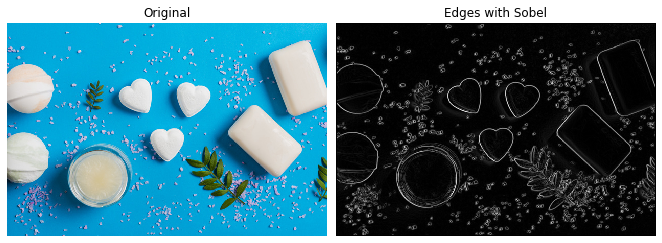

In [21]:
# Edge detection

soaps_image = plt.imread(data_folder + "soap_image.jpg")

# Import the color module
from skimage import color

# Import the filters module and sobel function
from skimage.filters import sobel

# Make the image grayscale
soaps_image_gray = color.rgb2gray(soaps_image)

# Apply edge detection filter
edge_sobel = sobel(soaps_image_gray)

# Show original and resulting image to compare
plt.subplot(1, 2, 1)
show_image(soaps_image, "Original")
plt.subplot(1, 2, 2)
show_image(edge_sobel, "Edges with Sobel")

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.03, hspace=0.03)
plt.show()

Exercício 3

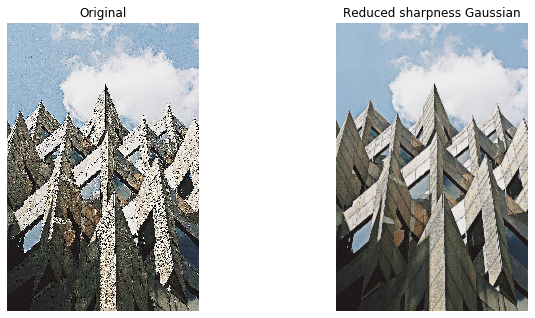

In [22]:
# Blurring to reduce noise

building_image = plt.imread(data_folder + "building_image.jpg")

# Import Gaussian filter 
from skimage.filters import gaussian

# Apply filter
gaussian_image = gaussian(building_image, multichannel=True)  # experimentei com False e deu na mesma

# Show original and resulting image to compare
plt.subplot(1, 2, 1)
show_image(building_image, "Original")
plt.subplot(1, 2, 2)
show_image(gaussian_image, "Reduced sharpness Gaussian")

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.03, hspace=0.03)
plt.show()


#### Exercício 4 - Contrast enhancement

The contrast is the difference between the maximum and the minimum pixel intensity in the image.

Example: in the Einstein image the contrast is 255 (255 - 0, see histogram). In the airplane image is about 100.


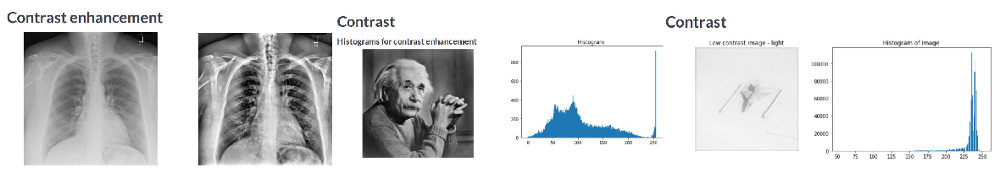

Enhance contrast:
- Contrast stretching
- Histogram equalization - there are 3 types:


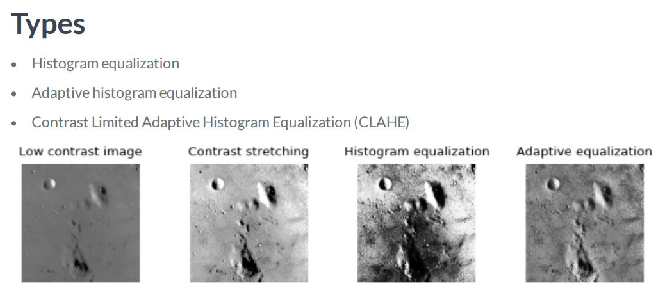


Histogram equalization:


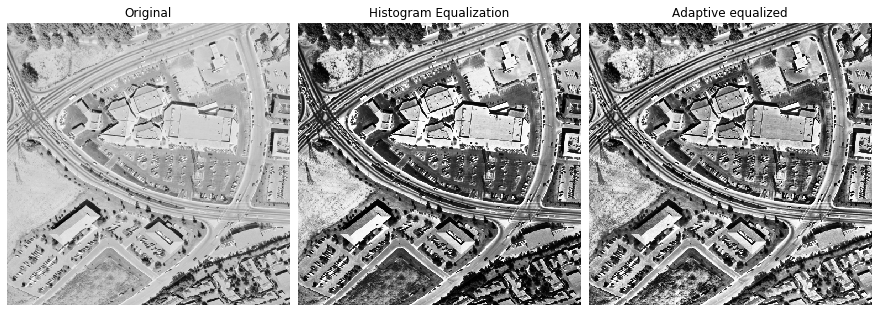

In [23]:
#vídeo

print("""The contrast is the difference between the maximum and the minimum pixel intensity in the image.

Example: in the Einstein image the contrast is 255 (255 - 0, see histogram). In the airplane image is about 100.""")

plot_3('contrast_enhancement', 'contrast_hist', 'contrast_hist_2')

print("""Enhance contrast:
- Contrast stretching
- Histogram equalization - there are 3 types:""")

plot_1('types', right=1.6)

print("=============================================================================================================\n")

image_aerial = plt.imread(data_folder + "image_aerial.tiff")

print("Histogram equalization:")

from skimage import exposure

# Obtain the equalized image
image_eq = exposure.equalize_hist(image_aerial)

# Show original and result
plt.subplot(1, 3, 1)
show_image(image_aerial, 'Original')

plt.subplot(1, 3, 2)
show_image(image_eq, 'Histogram Equalization')


# Adaptive Equalization
# Contrastive Limited Adaptive Histogram Equalization (CLAHE) --> CLAHE in scikit-image:

# Apply adaptive Equalization
image_adapteq = exposure.equalize_adapthist(image_aerial, clip_limit=0.03)

# Show original and result
plt.subplot(1, 3, 3)
show_image(image_adapteq, 'Adaptive equalized')

plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.03, hspace=0.03)
plt.show()


Exercício 5

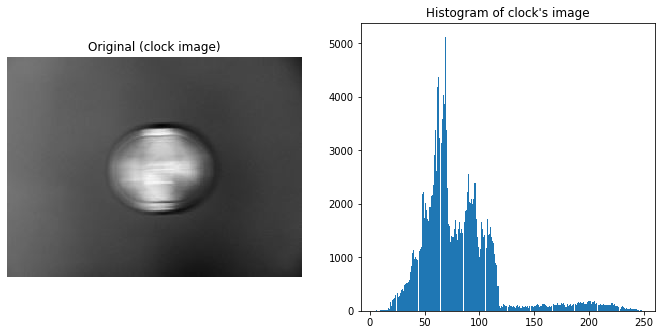

The contrast of clock's image is equal to 244.


numpy.ndarray

In [24]:
# What's the contrast of this image? (The histogram tell us)

clock_image = plt.imread(data_folder + "clock_image.jpg")

plt.subplot(1, 2, 1)
show_image(clock_image, 'Original (clock image)')

plt.subplot(1, 2, 2)
plt.hist(clock_image.ravel(), bins=256)
plt.title("Histogram of clock's image")

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("""The contrast of clock's image is equal to {}.""".format(np.max(clock_image) - np.min(clock_image)))
type(clock_image)  

Exercício 6

Chest X-ray image from the National Institutes of Health Chest X-Ray Dataset:

- https://www.kaggle.com/nih-chest-xrays

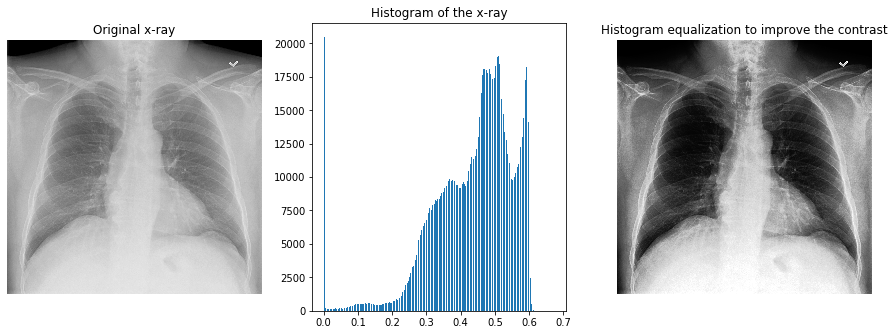

In [25]:
# Medical images

chest_xray_image = plt.imread(data_folder + "chest_xray_image.png")

# Import the required module
from skimage import exposure

# Show original x-ray image and its histogram
plt.subplot(1, 3, 1)
show_image(chest_xray_image, 'Original x-ray')

plt.subplot(1, 3, 2)
plt.hist(chest_xray_image.ravel(), bins=256)
plt.title('Histogram of the x-ray')

# Use histogram equalization to improve the contrast
xray_image_eq =  exposure.equalize_hist(chest_xray_image)

# Show the resulting image
plt.subplot(1, 3, 3)
show_image(xray_image_eq, 'Histogram equalization to improve the contrast')

plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.2, hspace=0.03)
plt.show()

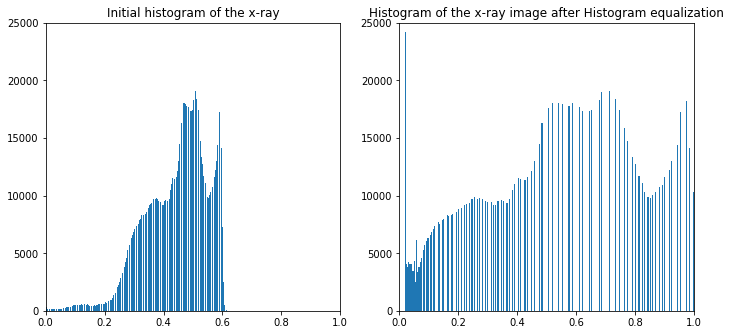

In [26]:
# comparando os histogramas 
plt.subplot(1, 2, 1)
plt.hist(chest_xray_image.ravel(), bins=256)
plt.title('Initial histogram of the x-ray')
plt.ylim(0, 25000)
plt.xlim(0, 1)
plt.subplot(1, 2, 2)
plt.hist(xray_image_eq.ravel(), bins=256)
plt.title("Histogram of the x-ray image after Histogram equalization")
plt.ylim(0, 25000)
plt.xlim(0, 1)
plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 7

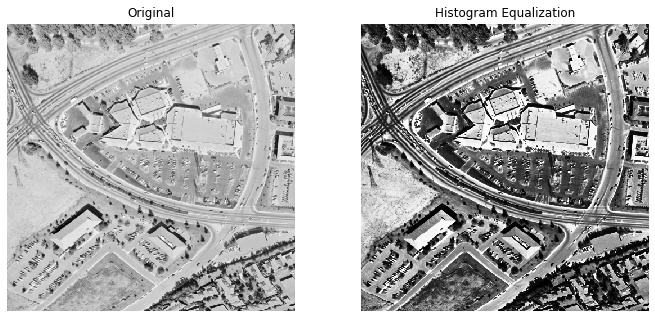

In [27]:
# Aerial image (mais um exemplo)

# For this we will use the normal or standard technique of Histogram Equalization.

# Import the required module
from skimage import exposure

# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_hist(image_aerial)

# Show the original and resulting image
plt.subplot(1, 2, 1)
show_image(image_aerial, 'Original')

plt.subplot(1, 2, 2)
show_image(image_eq, 'Histogram Equalization')

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 8

C:\Users\Admin\Anaconda3\lib\site-packages\skimage\util\dtype.py:135: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


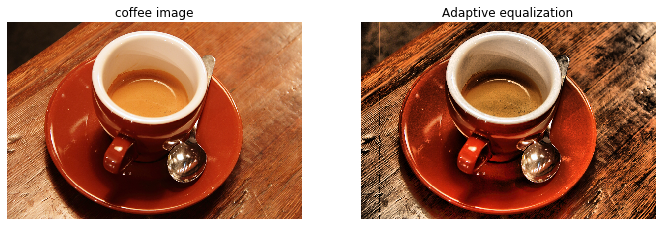

We have increased the contrast of the image using an algorithm for local contrast enhancement, that uses histograms
computed over different tile regions of the image. Local details can therefore be enhanced even in regions that are darker 
or lighter than the rest of the image.


In [28]:
# Let's add some impact and contrast

# Import the necessary modules
from skimage import data, exposure

# Load the image
original_image = data.coffee()

# Apply the adaptive equalization on the original image
adapthist_eq_image = exposure.equalize_adapthist(original_image, clip_limit=0.03)

# Compare the original image to the equalized
plt.subplot(1, 2, 1)
show_image(original_image, 'coffee image')

plt.subplot(1, 2, 2)
show_image(adapthist_eq_image, 'Adaptive equalization')

plt.subplots_adjust(left=0, bottom=0, right=1.5, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("""We have increased the contrast of the image using an algorithm for local contrast enhancement, that uses histograms
computed over different tile regions of the image. Local details can therefore be enhanced even in regions that are darker 
or lighter than the rest of the image.""")

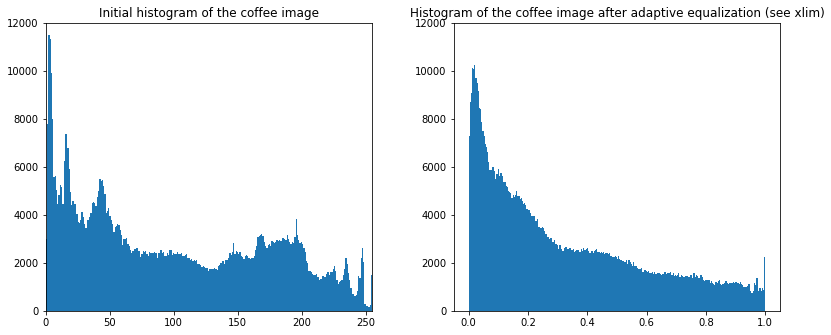

In [29]:
# comparando os histogramas - ?? ver depois
plt.subplot(1, 2, 1)
plt.hist(original_image.ravel(), bins=256)
plt.title('Initial histogram of the coffee image')
plt.ylim(0, 12000)
plt.xlim(0, 255)
plt.subplot(1, 2, 2)
plt.hist(adapthist_eq_image.ravel(), bins=256)
plt.title("Histogram of the coffee image after adaptive equalization (see xlim)")
plt.ylim(0, 12000)
# plt.xlim(0, 255)
plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.25, hspace=0.03)
plt.show()

#### Exercício 9 - Transformations

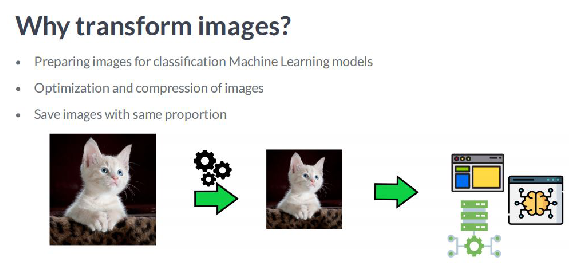

Rotating:


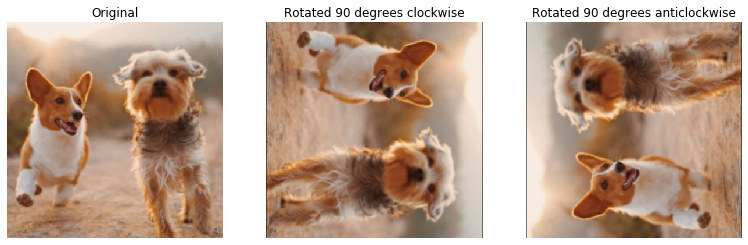

Rescaling:


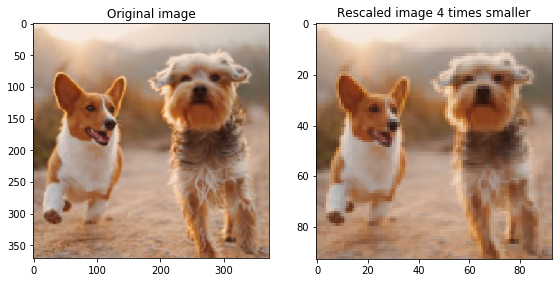

Aliasing in digital images:


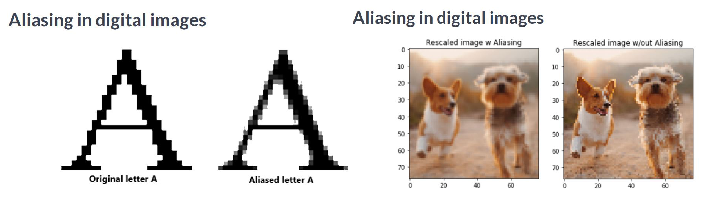

Resizing:


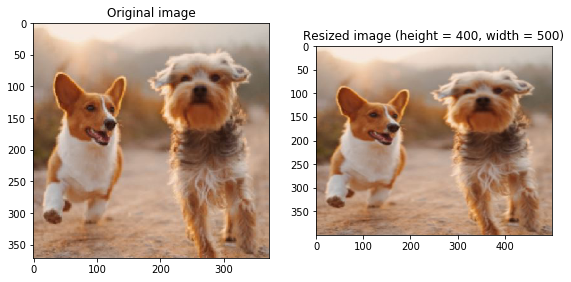

Resizing proportionally:


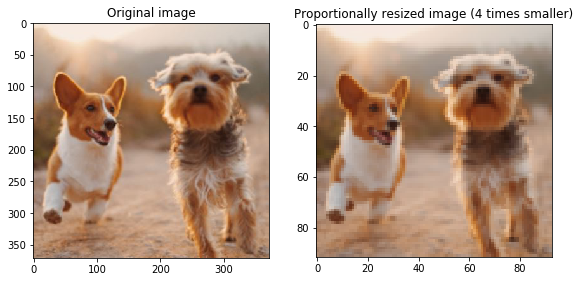

In [30]:
#vídeo

plot_1('why_transform', right=1.3)

# Rotating
print("Rotating:")

dogs = plt.imread(data_folder + "dogs.jpg")
plt.subplot(1, 3, 1)
show_image(dogs, 'Original')

# rotating the image 90 degrees clockwise & anticlockwise
from skimage.transform import rotate

plt.subplot(1, 3, 2)
show_image(rotate(dogs, -90), "Rotated 90 degrees clockwise")

plt.subplot(1, 3, 3)
show_image(rotate(dogs, 90), "Rotated 90 degrees anticlockwise")

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

############################################################################################

# Rescaling
print("Rescaling:")

# downgrading
from skimage.transform import rescale

# Rescale the image to be 4 times smaller
image_rescaled = rescale(dogs, 1/4, anti_aliasing=True, multichannel=True)

plt.subplot(1, 2, 1)
show_image(dogs, 'Original image')
plt.axis('on')

plt.subplot(1, 2, 2)
show_image(image_rescaled, 'Rescaled image 4 times smaller')
plt.axis('on')

plt.subplots_adjust(left=0, bottom=0, right=1.2, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("===============================================================================================================")
############################################################################################

# Aliasing in digital images
print("Aliasing in digital images:")
plot_2('aliasing', 'aliasing_2', right=1.6)

############################################################################################

# Resizing
print("Resizing:")

from skimage.transform import resize

# Height and width to resize
height = 400
width = 500

# Resize image
image_resized = resize(dogs, (height, width), anti_aliasing=True)

# Show the original and resulting images
plt.subplot(1, 2, 1)
show_image(dogs, 'Original image')
plt.axis('on')

plt.subplot(1, 2, 2)
show_image(image_resized, 'Resized image (height = 400, width = 500)')
plt.axis('on')

plt.subplots_adjust(left=0, bottom=0, right=1.2, top=1, wspace=0.2, hspace=0.03)
plt.show()


# Resizing proportionally
print("Resizing proportionally:")

from skimage.transform import resize

# Set proportional height so its 4 times its size
height = int(dogs.shape[0] / 4)
width = int(dogs.shape[1] / 4)

# Resize image
image_resized = resize(dogs, (height, width), anti_aliasing=True)

plt.subplot(1, 2, 1)
show_image(dogs, 'Original image')
plt.axis('on')

plt.subplot(1, 2, 2)
show_image(image_resized, 'Proportionally resized image (4 times smaller)')
plt.axis('on')

plt.subplots_adjust(left=0, bottom=0, right=1.2, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 10

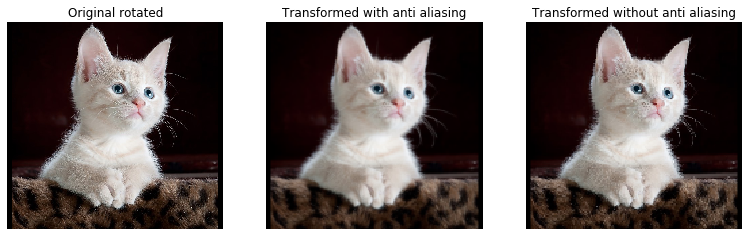

The anti aliasing filter prevents the poor pixelation effect to happen, making it look better but also less sharp.



In [31]:
# Aliasing, rotating and rescaling

image_cat = plt.imread(data_folder + "image_cat.jpg")

# Import the module and the rotate and rescale functions
from skimage.transform import rotate, rescale

# Rotate the image 90 degrees clockwise 
rotated_cat_image = rotate(image_cat, -90)

plt.subplot(1, 3, 1)
show_image(rotated_cat_image, 'Original rotated')

# Rescale with anti aliasing
rescaled_with_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=True, multichannel=True)

# Rescale without anti aliasing
rescaled_without_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=False, multichannel=True)

# Show the resulting images
plt.subplot(1, 3, 2)
show_image(rescaled_with_aa, "Transformed with anti aliasing")

plt.subplot(1, 3, 3)
show_image(rescaled_without_aa, "Transformed without anti aliasing")

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("""The anti aliasing filter prevents the poor pixelation effect to happen, making it look better but also less sharp.
""")

Exercício 11

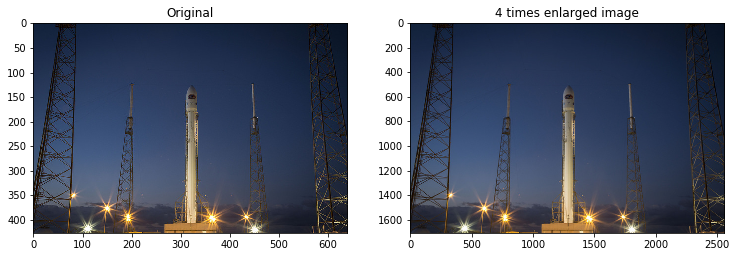

The image went from being 600 pixels wide to over 2500 and it still does not look poorly pixelated.


In [32]:
# Enlarging images

# Import the module and function to enlarge images
from skimage.transform import rescale

# Import the data module
from skimage import data

# Load the image from data
rocket_image = data.rocket()

# Enlarge the image so it is 4 times bigger
enlarged_rocket_image = rescale(rocket_image, 4, anti_aliasing=True, multichannel=True)

# Show original and resulting image
plt.subplot(1, 2, 1)
show_image(rocket_image, 'Original')
plt.axis('on')

plt.subplot(1, 2, 2)
show_image(enlarged_rocket_image, "4 times enlarged image")
plt.axis('on')

plt.subplots_adjust(left=0, bottom=0, right=1.6, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("""The image went from being 600 pixels wide to over 2500 and it still does not look poorly pixelated.""")

Exercício 12

Dogs image shape: (423, 640, 3)


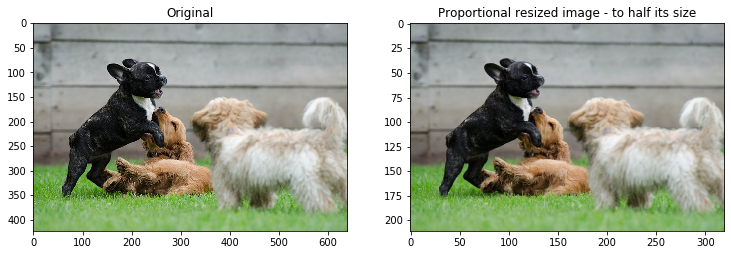

In [33]:
# Proportionally resizing

# We want to downscale the images of a veterinary blog website so all of them have the same compressed size.

dogs_banner = plt.imread(data_folder + "dogs_banner.jpg")

# Import the module and function
from skimage.transform import resize

# Set proportional height so its half its size
print("Dogs image shape: {}".format(dogs_banner.shape))
height = int(dogs_banner.shape[0] / 2)
width = int(dogs_banner.shape[1] / 2)

# Resize using the calculated proportional height and width
image_resized = resize(dogs_banner, (height, width), anti_aliasing=True)

# Show the original and rotated image
plt.subplot(1, 2, 1)
show_image(dogs_banner, 'Original')
plt.axis('on')

plt.subplot(1, 2, 2)
show_image(image_resized, 'Proportional resized image - to half its size')
plt.axis('on')

plt.subplots_adjust(left=0, bottom=0, right=1.6, top=1, wspace=0.2, hspace=0.03)
plt.show()


#### Exercício 13 - Morphology

binary images (colored) and thresholded

Dilatation adds pixels to the boundaries of the objects in an image, Erosion removes them.


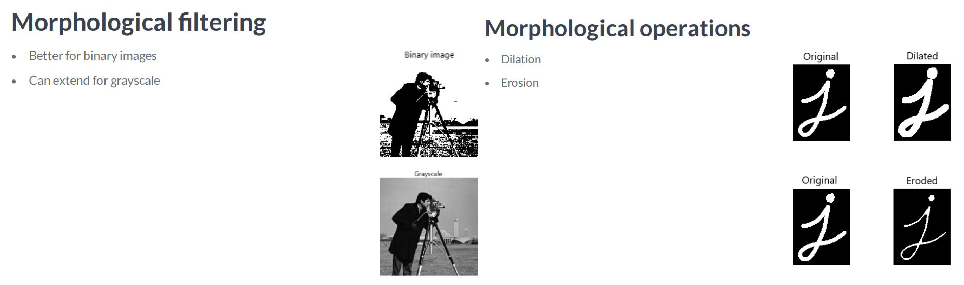

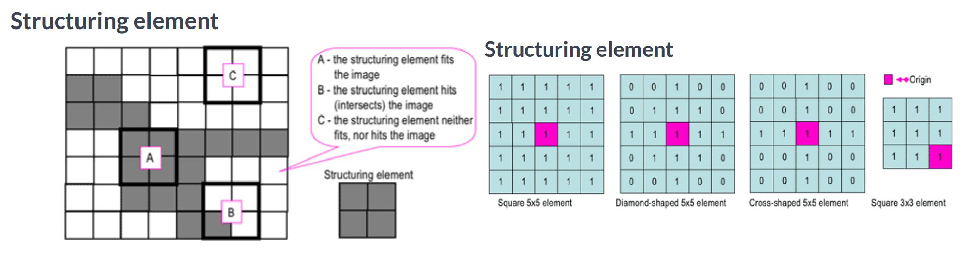

Shapes in scikit-image:
square:
 [[1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]]
rectangle:
 [[1 1]
 [1 1]
 [1 1]
 [1 1]] 

Erosion in scikit-image:


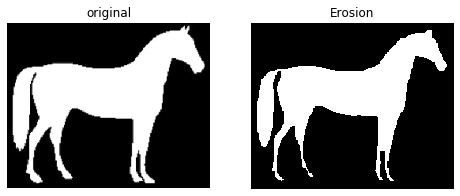


Dilation in scikit-image:


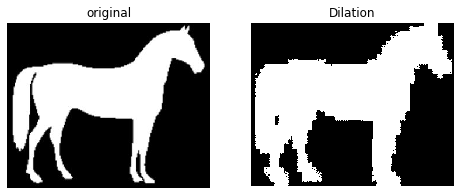

In [34]:
#vídeo

print("binary images (colored) and thresholded\n")
print("""Dilatation adds pixels to the boundaries of the objects in an image, Erosion removes them.""")
plot_2('morphological', 'morphological_operations')

plot_2('structuring_element', 'structuring_element_2')

# Shapes in scikiimagege
print("Shapes in scikit-image:")

from skimage import morphology

square = morphology.square(4)
rectangle = morphology.rectangle(4, 2)
print("square:\n", square)
print("rectangle:\n", rectangle, "\n")

###############################################################

image_horse = plt.imread(data_folder + "image_horse.jpg")
image_horse = color.rgb2gray(image_horse)

# Erosion in scikit-image
print("Erosion in scikit-image:")

from skimage import morphology

# Set structuring element to the rectangular-shaped
selem = morphology.rectangle(12, 6)

# Obtain the erosed image with binary erosion
eroded_image = morphology.binary_erosion(image_horse, selem=selem)       

# Show result
plot_comparison(image_horse, eroded_image, 'Erosion')
plt.show()

# plot_2('erosion', 'binary_erosion')

###############################################################
print("=====================================================================================================\n")

# Dilation in scikit-image
print("Dilation in scikit-image:")

from skimage import morphology

# Obtain dilated image, using binary dilation
dilated_image = morphology.binary_dilation(image_horse)

# See results
plot_comparison(image_horse, dilated_image, 'Dilation')   
plt.show()


Exercício 14

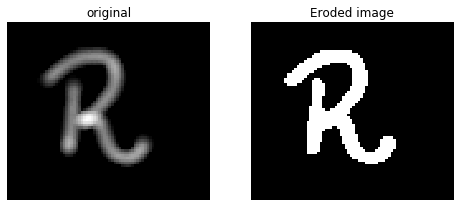

In [35]:
# Handwritten letters

# A very interesting use of computer vision in real-life solutions is performing Optical Character Recognition (OCR) to 
# distinguish printed or handwritten text characters inside digital images of physical documents.

upper_r_image = color.rgb2gray(plt.imread(data_folder + "r5.png"))

# Import the morphology module
from skimage import morphology

# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(upper_r_image) 

# See results
plot_comparison(upper_r_image, eroded_image_shape, 'Eroded image')


Exercício 15

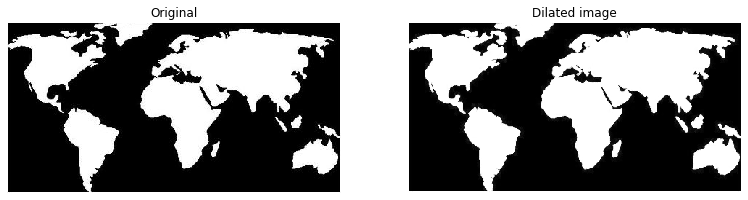

In [36]:
# Improving thresholded image

world_image = plt.imread(data_folder + "world_image.jpg")

# Import the module
from skimage import morphology

# Obtain the dilated image 
dilated_image = morphology.dilation(world_image)

# See results
plt.subplot(1, 2, 1)
show_image(world_image, 'Original')

plt.subplot(1, 2, 2)
show_image(dilated_image, 'Dilated image')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

# Chapter 3 - Image restoration, Noise, Segmentation and Contours

So far, you have done some very cool things with your image processing skills. In this chapter, you will apply **image restoration to remove objects, logos, text, or damaged areas** in pictures. You will also learn how to apply noise, use segmentation to speed up processing, and find elements in images by their contours.

In [37]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Image Processing with Python/chapter 3/"

#### Exercício 1 - Image restoration

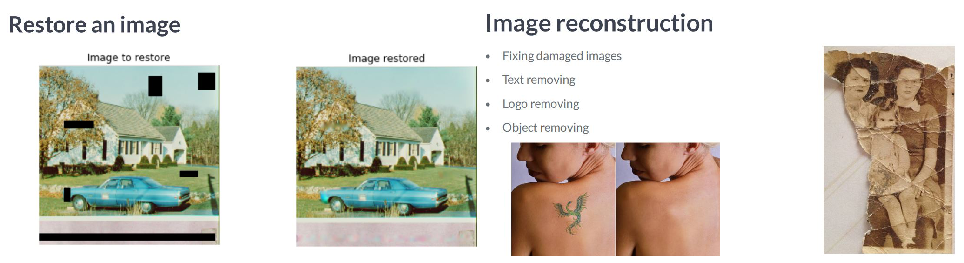

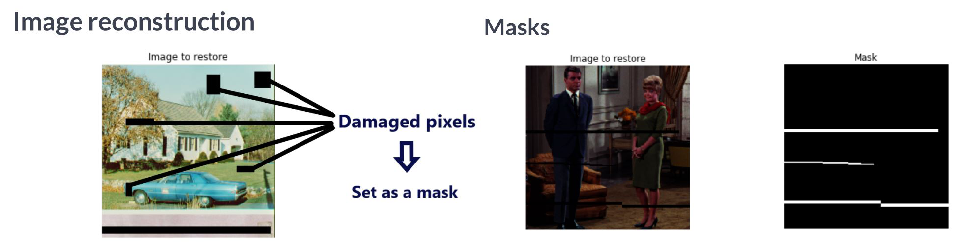


defect image shape: (296, 512, 3)


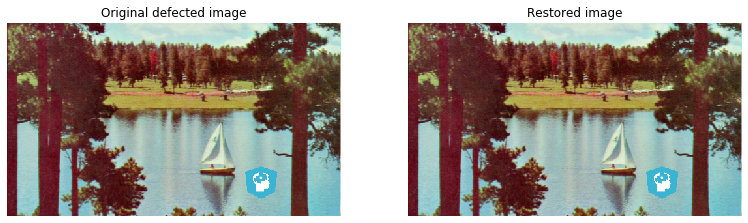

In [38]:
#vídeo

# Restore an image

plot_2('restore_image', 'image_reconstruction')
plot_2('image_reconstruction_2', 'mask')

####################################################################

# Masks
def get_mask(image):
    ''' Creates mask with defect regions '''
    mask = np.zeros(image.shape[:-1])
    mask[350:420, 210:270] = 1
    return mask

##################################################################################################

# Image reconstruction in scikit-image

from skimage.restoration import inpaint

defect_image = plt.imread(data_folder + "4.2.06_w_logo_2_2.png")
print("\ndefect image shape: {}".format(defect_image.shape))

# Obtain the mask
mask = get_mask(defect_image)

# Apply inpainting to the damaged image using the mask
restored_image = inpaint.inpaint_biharmonic(defect_image, mask, multichannel=True)

# Show the resulting image
plt.subplot(1, 2, 1)
show_image(defect_image, 'Original defected image')

plt.subplot(1, 2, 2)
show_image(restored_image, 'Restored image')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 2

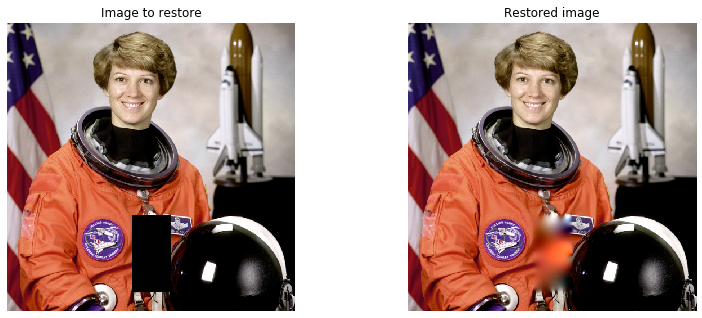

Wall time: 1min


In [39]:
%%time
# Restore a damaged image

# We'll work on an image from the data module, obtained by data.astronaut(). Some of the pixels have been replaced by 1s 
# using a binary mask, on purpose, to simulate a damaged image. Replacing pixels with 1s turns them totally black. The 
# defective image is saved as an array called defect_image.

# create a defected image and the corresponding mask based on a 'good' image (fui eu q fiz)
def get_defected_and_mask(good_image, n=4):
    ''' Creates n black (defected) regions and the corresponding mask '''
    mask = np.zeros(good_image.shape[:-1])
    for i in range(n):
        a, b, c, d = np.random.randint(0, good_image.shape[0]), np.random.randint(0, good_image.shape[1]), \
                     np.random.randint(0, good_image.shape[0]), np.random.randint(0, good_image.shape[1])
        good_image[a:b, c:d] = 1
        mask[a:b, c:d] = 1
    return good_image, mask

defected_image_astronaut = get_defected_and_mask(data.astronaut(), 6)

mask = defected_image_astronaut[1]

############################################################################################

# Import the module from restoration
from skimage.restoration import inpaint

# Show the defective image
plt.subplot(1, 2, 1)
show_image(defected_image_astronaut[0], 'Image to restore')

# Apply the restoration function to the image using the mask
restored_image = inpaint.inpaint_biharmonic(defected_image_astronaut[0], mask, multichannel=True)

plt.subplot(1, 2, 2)
show_image(restored_image, 'Restored image')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 3

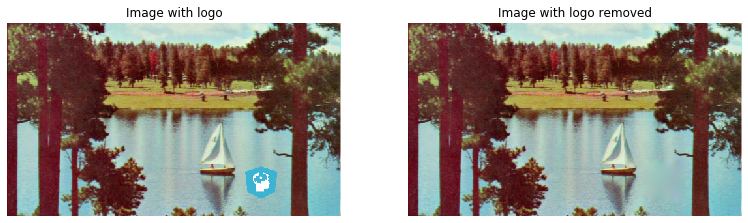

In [40]:
# Removing logos

image_with_logo = plt.imread(data_folder + "4.2.06_w_logo_2_2.png")

# Initialize the mask
mask = np.zeros(image_with_logo.shape[:-1])

# Set the pixels where the logo is to 1
mask[210:272, 360:425] = 1

# Apply inpainting to remove the logo
image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo, mask, multichannel=True)

# Show the original and logo removed images
plt.subplot(1, 2, 1)
show_image(image_with_logo, 'Image with logo')

plt.subplot(1, 2, 2)
show_image(image_logo_removed, 'Image with logo removed')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

#### Exercício 4 - Noise

Noise:


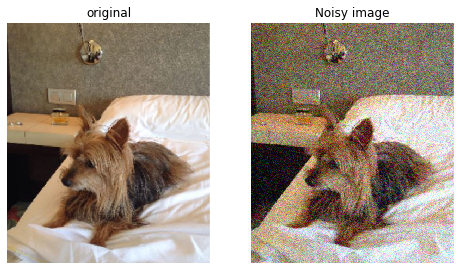


Denoising:

Denoising types: 
            1) Total variation (TV)
            2) Bilateral
            3) Wavelet denoising
            4) Non-local means denoising


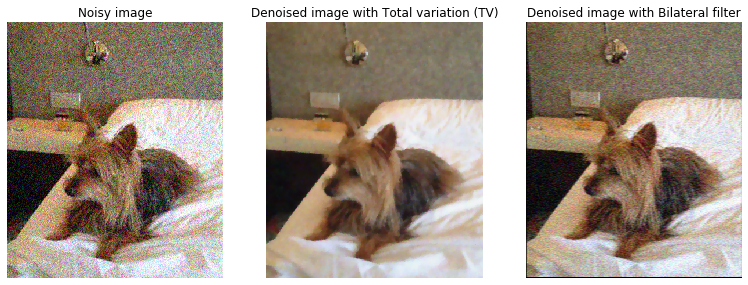

In [41]:
#vídeo

# Apply noise in scikit-image
print("Noise:")
dog_image = plt.imread(data_folder + "dog_image.jpg")

# Import the module and function
from skimage.util import random_noise

# Add noise to the image
noisy_image = random_noise(dog_image)

# Show original and resulting image
plot_comparison(dog_image, noisy_image, 'Noisy image')
plt.show()

###########################################################################################
print("=======================================================================================================")

# Reducing noise
print("\nDenoising:\n")
print("""Denoising types: 
            1) Total variation (TV)
            2) Bilateral
            3) Wavelet denoising
            4) Non-local means denoising""")

# 1) Using total variation filter denoising
from skimage.restoration import denoise_tv_chambolle

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, weight=0.1, multichannel=True)

# Show denoised image
plt.subplot(1, 3, 1)
show_image(noisy_image, 'Noisy image')

plt.subplot(1, 3, 2)
show_image(denoised_image, 'Denoised image with Total variation (TV)')

# 2) Bilateral filter
from skimage.restoration import denoise_bilateral

# Apply bilateral filter denoising
denoised_image = denoise_bilateral(noisy_image, multichannel=True)

# Show original and resulting images
plt.subplot(1, 3, 3)
show_image(denoised_image, 'Denoised image with Bilateral filter')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()


Exercício 5

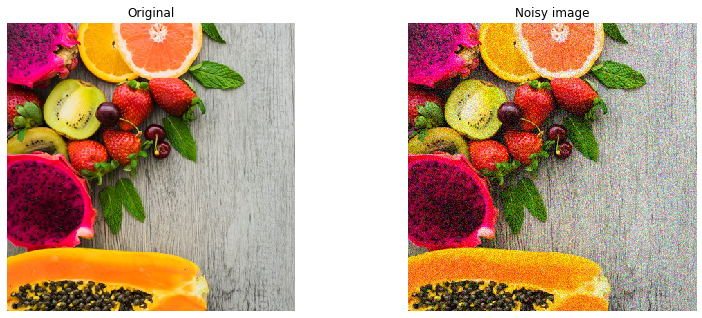

In [42]:
# Make noise

fruit_image = plt.imread(data_folder + "fruits_square.jpg")

# Import the module and function
from skimage.util import random_noise

# Add noise to the image
noisy_image = random_noise(fruit_image)

# Show original and resulting image
plt.subplot(1, 2, 1)
show_image(fruit_image, 'Original')

plt.subplot(1, 2, 2)
show_image(noisy_image, 'Noisy image')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()


Exercício 6

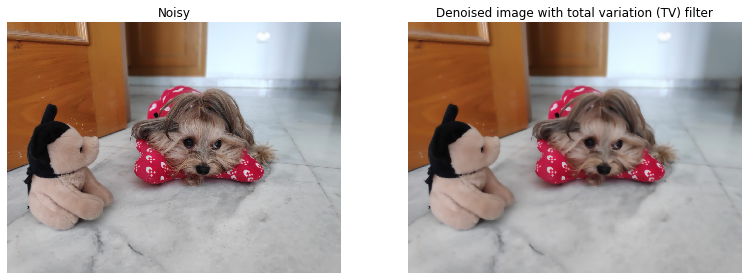

In [43]:
# Reducing noise

noisy_image = plt.imread(data_folder + "miny.jpeg")

# Import the module and function
from skimage.restoration import denoise_tv_chambolle

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, multichannel=True)

# Show the noisy and denoised images
plt.subplot(1, 2, 1)
show_image(noisy_image, 'Noisy')

plt.subplot(1, 2, 2)
show_image(denoised_image, 'Denoised image with total variation (TV) filter')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()


Exercício 7

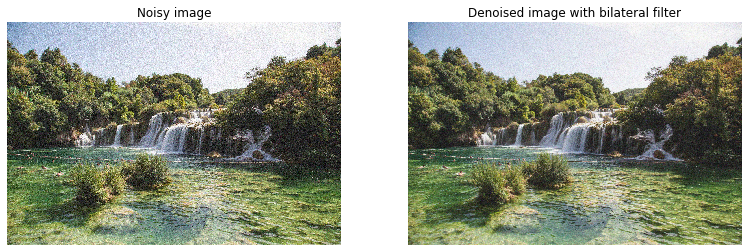

We denoised the image without losing sharpness.
In this case denoise_bilateral() worked well with the default optional parameters.


In [44]:
# Reducing noise while preserving edges

landscape_image = plt.imread(data_folder + "noise-noisy-nature.jpg")

# Import bilateral denoising function
from skimage.restoration import denoise_bilateral

# Apply bilateral filter denoising
denoised_image = denoise_bilateral(landscape_image, 
                                   multichannel=True)

# Show original and resulting images
plt.subplot(1, 2, 1)
show_image(landscape_image, 'Noisy image')

plt.subplot(1, 2, 2)
show_image(denoised_image, 'Denoised image with bilateral filter')

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

print("""We denoised the image without losing sharpness.
In this case denoise_bilateral() worked well with the default optional parameters.""")

#### Exercício 8 - Superpixels & segmentation

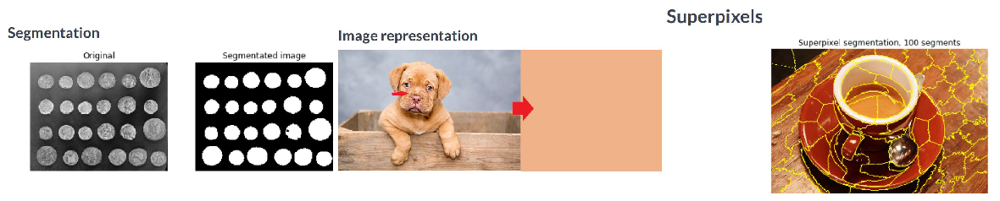

Benefits of superpixels:
- More meaningful regions
- Computational efficiency

Segmentation:
- Supervised
- Unsupervised

Unsupervised segmentation (SLIC - Simple Linear Iterative Clustering):


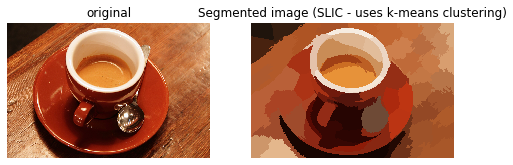

More segments:


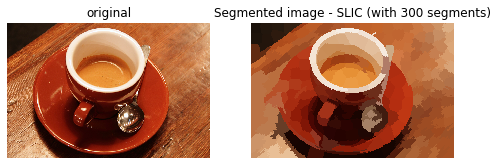

In [45]:
#vídeo

# Segmentation
plot_3('segmentation', 'image_representation', 'superpixels')
print("""Benefits of superpixels:
- More meaningful regions
- Computational efficiency""")
print("""\nSegmentation:
- Supervised
- Unsupervised""")

print("""\nUnsupervised segmentation (SLIC - Simple Linear Iterative Clustering):""")

# Import the modules
from skimage.segmentation import slic
from skimage.color import label2rgb

image = data.coffee()

# Obtain the segments
segments = slic(image)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, image, kind='avg')

plot_comparison(image, segmented_image, "Segmented image (SLIC - uses k-means clustering)")
plt.show()

########################################################################################

print("More segments:")

# Import the modules
from skimage.segmentation import slic
from skimage.color import label2rgb

# Obtain the segmentation with 300 regions
segments = slic(image, n_segments= 300)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, image, kind='avg')

plot_comparison(image, segmented_image, "Segmented image - SLIC (with 300 segments)")
plt.show()

Exercício 9

In [46]:
# Number of pixels

face_image = plt.imread(data_folder + "chinese.jpg")

print(face_image.shape)
print(face_image.shape[0]*face_image.shape[1])

print("""\nface_image is 265 * 191 = 50,615 pixels""")

(265, 191, 3)
50615

face_image is 265 * 191 = 50,615 pixels


Exercício 10

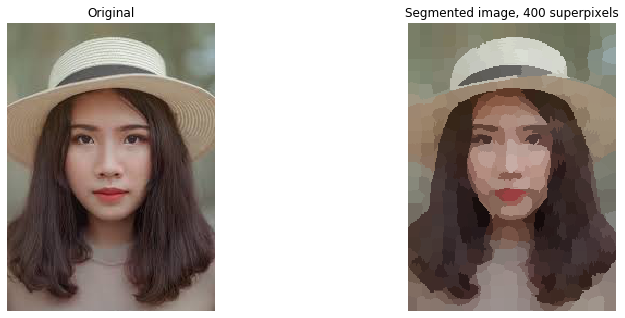

50 615 pixels reduced to 400 regions.


In [47]:
# Superpixel segmentation

# In this exercise, you will apply unsupervised segmentation to the same image, before it's passed to a face detection
# machine learning model.

# Import the slic function from segmentation module
from skimage.segmentation import slic

# Import the label2rgb function from color module
from skimage.color import label2rgb

# Obtain the segmentation with 400 regions
segments = slic(face_image, n_segments= 400)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, face_image, kind='avg')

# Show the segmented image
plt.subplot(1, 2, 1)
show_image(face_image, 'Original')

plt.subplot(1, 2, 2)
show_image(segmented_image, "Segmented image, 400 superpixels")

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()
print("50 615 pixels reduced to 400 regions.")

#### Exercício 11 - Finding contours

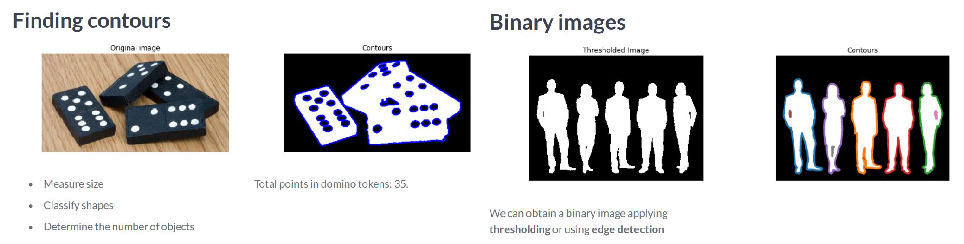


Find contours using scikit-image:


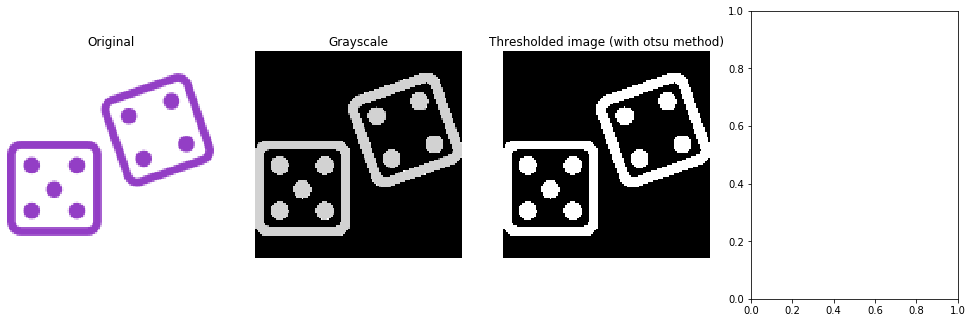

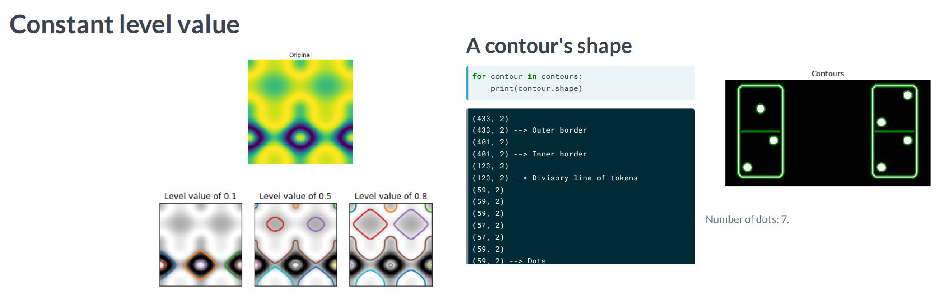

In [48]:
#vídeo

plot_2('contours', 'binary_images')

print("""\nFind contours using scikit-image:""")

# Find contours using scikit-image

# 1) PREPARING THE IMAGE - Transform the image to 2D grayscale
image = plt.imread(data_folder + "dices.png")
image2 = color.rgb2gray(image)

# 2) PREPARING THE IMAGE - Binarize the image. Obtain the threshold value
thresh = threshold_otsu(image2)
# Apply thresholding
thresholded_image = image2 > thresh

# 3) APPLY CONTOURS

# Import the measure module
from skimage import measure

# Find contours at a constant value of 0.8
contours = measure.find_contours(thresholded_image, 0.8)

plt.subplot(1, 4, 1)
show_image(image, 'Original')
plt.subplot(1, 4, 2)
show_image(image2, "Grayscale")
plt.subplot(1, 4, 3)
show_image(thresholded_image, "Thresholded image (with otsu method)")
plt.subplot(1, 4, 4)
# show_image(contours, 0.8)

plt.subplots_adjust(left=0, bottom=0, right=2.2, top=1, wspace=0.2, hspace=0.03)
plt.show()

###################################################################################################

# Constant level value
plot_2('constant_level', 'contour_shape')


Exercício 12

In [49]:
def show_image_contour(image, contours):
    plt.figure()
    for n, contour in enumerate(contours):
        plt.plot(contour[:, 1], contour[:, 0], linewidth=3)
    plt.imshow(image, interpolation='nearest', cmap='gray_r')
    plt.title('Contours')
    plt.axis('off')
    plt.show() 

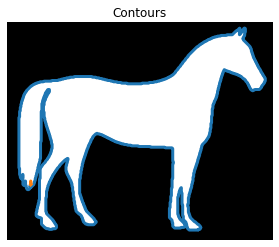

In [50]:
# Contouring shapes

# Import the modules
from skimage import data, measure

# Obtain the horse image
horse_image = data.horse()

# Find the contours with a constant level value of 0.8
contours = measure.find_contours(horse_image, 0.8)

# Shows the image with contours found
show_image_contour(horse_image, contours)

Exercício 13

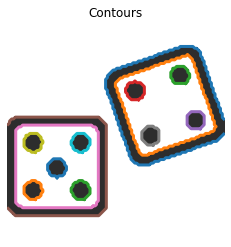

In [51]:
# Find contours of an image that is not binary

image_dices = plt.imread(data_folder + "dices.png")

# Make the image grayscale
image_dices = color.rgb2gray(image_dices)

# Obtain the optimal thresh value
thresh = threshold_otsu(image_dices)

# Apply thresholding
binary = image_dices > thresh

# Find contours at a constant value of 0.8
contours = measure.find_contours(binary, 0.8)

# Show the image
show_image_contour(image_dices, contours)


Exercício 14

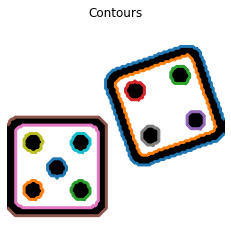

Dice's dots number: 9. 


In [52]:
# Count the dots in a dice's image

# Create list with the shape of each contour
shape_contours = [cnt.shape[0] for cnt in contours]

# Set 50 as the maximum size of the dots shape
max_dots_shape = 50

# Count dots in contours excluding bigger than dots size
dots_contours = [cnt for cnt in contours if np.shape(cnt)[0] < max_dots_shape]

# Shows all contours found 
show_image_contour(binary, contours)

# Print the dice's number
print("Dice's dots number: {}. ".format(len(dots_contours)))


# Chapter 4 - Advanced Operations, Detecting Faces and Features

After completing this chapter, you will have a deeper knowledge of image processing as you will be able to **detect edges, corners, and even faces**. You will learn how to detect not just front faces but also face profiles, cat, or dogs. You will apply your skills to more complex **real-world applications**. Learn to master several widely used image processing techniques with very few lines of code.

In [53]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Image Processing with Python/chapter 4/"

#### Exercício 1 - Finding the edges with Canny

Edge detection:


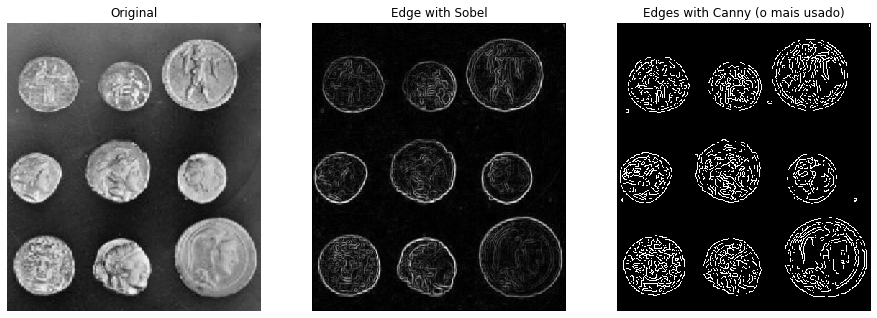

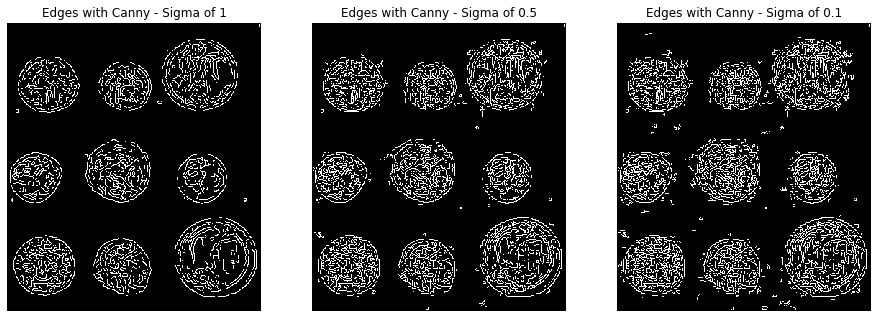

In [54]:
#vídeo

print("Edge detection:")

from skimage.feature import canny

# Convert image to grayscale
coins = color.rgb2gray(image_coins)

# Apply Canny detector
canny_edges = canny(coins)

# Show resulted image with edges
from skimage.filters import sobel
edge_sobel = sobel(image_coins)

# Show original and resulting image to compare
plt.subplot(1, 3, 1)
show_image(image_coins, 'Original')
plt.subplot(1, 3, 2)
show_image(edge_sobel, "Edge with Sobel")
plt.subplot(1, 3, 3)
show_image(canny_edges, "Edges with Canny (o mais usado)")
plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.2, hspace=0.03)
plt.show()

# Canny edge detector

# Apply Canny detector with a sigma of 0.5 and other with sigma = 0.1
canny_edges_0_5 = canny(coins, sigma=0.5)
canny_edges_0_1 = canny(coins, sigma=0.1)

# Show resulted images with edges
plt.subplot(1, 3, 1)
show_image(canny_edges, "Edges with Canny - Sigma of 1")
plt.subplot(1, 3, 2)
show_image(canny_edges_0_5, "Edges with Canny - Sigma of 0.5")
plt.subplot(1, 3, 3)
show_image(canny_edges_0_1, "Edges with Canny - Sigma of 0.1")
plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 2

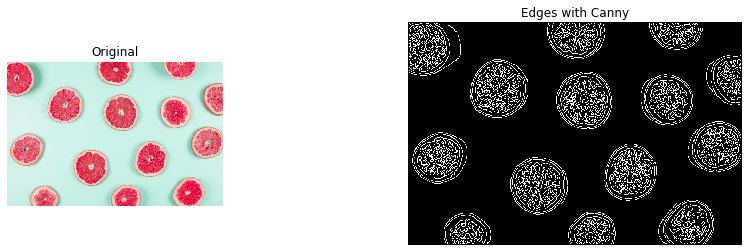

In [55]:
# Edges

grapefruit = plt.imread(data_folder + "toronjas.jpg")

plt.subplot(1, 3, 1)
show_image(grapefruit, 'Original')


# Import the canny edge detector 
from skimage.feature import canny

# Convert image to grayscale
grapefruit = color.rgb2gray(grapefruit)

# Apply canny edge detector
canny_edges = canny(grapefruit)

# Show resulting image
plt.subplot(1, 2, 2)
show_image(canny_edges, "Edges with Canny")

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()

Exercício 3

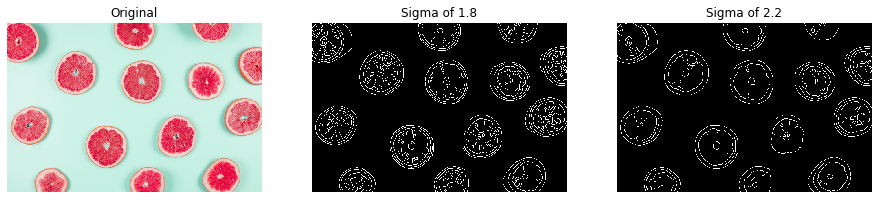

In [56]:
# Less edgy

grapefruit = plt.imread(data_folder + "toronjas.jpg")
plt.subplot(1, 3, 1)
show_image(grapefruit, 'Original')

grapefruit = color.rgb2gray(grapefruit)

# Apply canny edge detector with a sigma of 1.8 % of 2.2
edges_1_8 = canny(grapefruit, sigma=1.8)
edges_2_2 = canny(grapefruit, sigma=2.2)

# Show resulting images
plt.subplot(1, 3, 2)
show_image(edges_1_8, "Sigma of 1.8")
plt.subplot(1, 3, 3)
show_image(edges_2_2, "Sigma of 2.2")

plt.subplots_adjust(left=0, bottom=0, right=2, top=1, wspace=0.2, hspace=0.03)
plt.show()


#### Exercício 4 - Right around the corner

Corner detection:


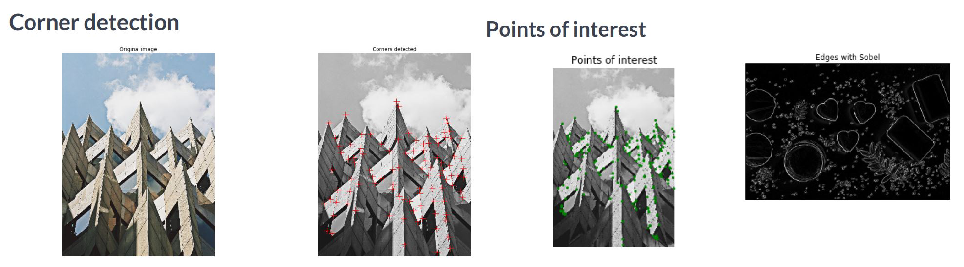

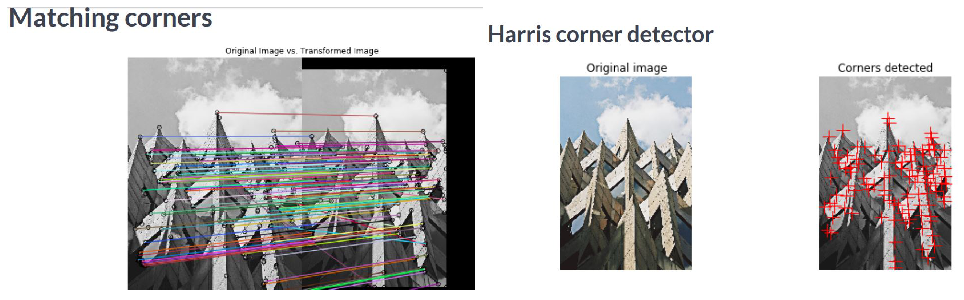

Harris corner detector:


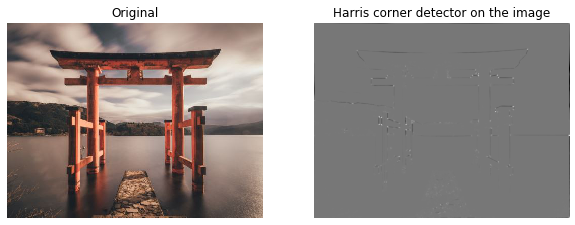

A total of 62 corners were detected.

Show image with corners:


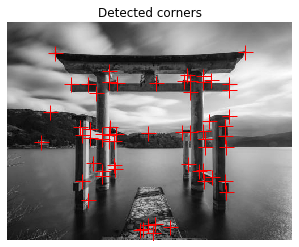

In [57]:
#vídeo

image_original = plt.imread(data_folder + "detect_corners.jpg")

print("Corner detection:")

plot_2('corners1', 'corners2')
plot_2('corners3', 'harris_corner_detection')

print("Harris corner detector:")

# Harris corner detector
from skimage.feature import corner_harris, corner_peaks

# Convert image to grayscale
image = rgb2gray(image_original)

# Apply the Harris corner detector on the image
measure_image = corner_harris(image)

# Show the Harris response image
plt.subplot(1, 2, 1)
show_image(image_original, 'Original')
plt.subplot(1, 2, 2)
show_image(measure_image, 'Harris corner detector on the image')
plt.subplots_adjust(left=0, bottom=0, right=1.3, top=1, wspace=0.2, hspace=0.03)
plt.show()

# Finds the coordinates of the corners
coords = corner_peaks(corner_harris(image), min_distance=5)

print("A total of", len(coords), "corners were detected.")

###########################################################################################

# Show image with contours
print("\nShow image with corners:")

def show_image_with_corners(image, coords, title="Detected corners"):
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.title(title)
    plt.plot(coords[:, 1], coords[:, 0], '+r', markersize=15)
    plt.axis('off')
#     plt.show()
    
# Show image with marks in detected corners
show_image_with_corners(image, coords)    
plt.show()

Exercício 5

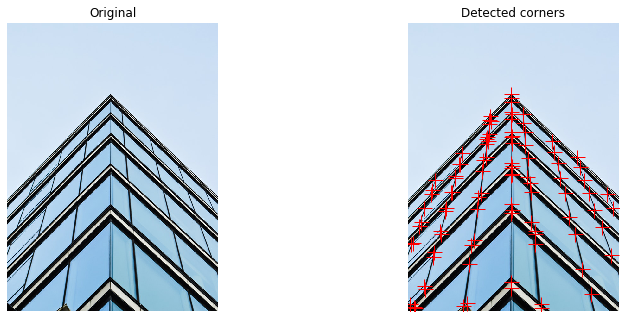

In [58]:
# Perspective

building_image = plt.imread(data_folder + "corners_building_top.jpg")

# Import the corner detector related functions and module
from skimage.feature import corner_harris, corner_peaks

# Convert image from RGB-3 to grayscale
building_image_gray = color.rgb2gray(building_image)

# Apply the detector  to measure the possible corners
measure_image = corner_harris(building_image_gray)

# Find the peaks of the corners using the Harris detector
coords = corner_peaks(measure_image, min_distance=2)

# Show original and resulting image with corners detected
plt.subplot(1, 2, 1)
show_image(building_image, "Original")

plt.subplot(1, 2, 2)
show_image_with_corners(building_image, coords)

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()


Exercício 6

With a min_distance setted to 2, we detect a total 98 corners in the image.
With a min_distance setted to 40, we detect a total 36 corners in the image.


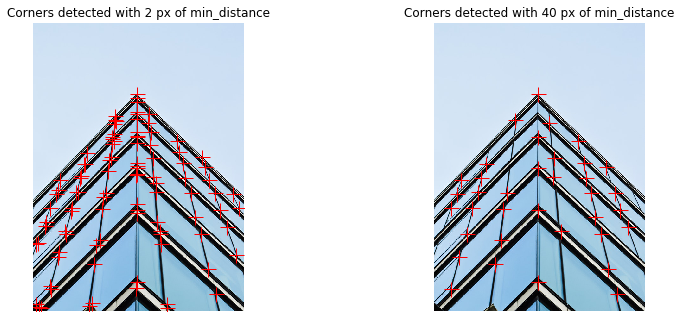

In [59]:
# Less corners

# Find the peaks with a min distance of 2 pixels
coords_w_min_2 = corner_peaks(measure_image, min_distance=2)
print("With a min_distance setted to 2, we detect a total", len(coords_w_min_2), "corners in the image.")

# Find the peaks with a min distance of 40 pixels
coords_w_min_40 = corner_peaks(measure_image, min_distance=40)
print("With a min_distance setted to 40, we detect a total", len(coords_w_min_40), "corners in the image.")

# Show original and resulting image with corners detected
plt.subplot(1, 2, 1)
show_image_with_corners(building_image, coords_w_min_2, "Corners detected with 2 px of min_distance")

plt.subplot(1, 2, 2)
show_image_with_corners(building_image, coords_w_min_40, "Corners detected with 40 px of min_distance")

plt.subplots_adjust(left=0, bottom=0, right=1.7, top=1, wspace=0.2, hspace=0.03)
plt.show()


#### Exercício 7 - Face detection

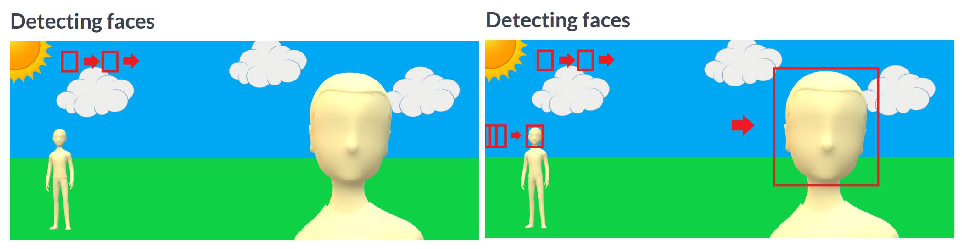

[{'r': 80, 'c': 258, 'width': 80, 'height': 80}]


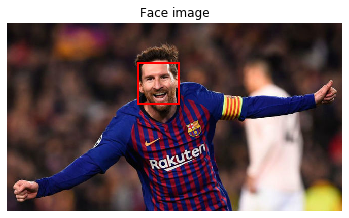

In [60]:
#vídeo

plot_2('faces1', 'faces2')

image = plt.imread(data_folder + "messi.jpg")

# Import the classifier class
from skimage.feature import Cascade

# Load the trained file from the module root.
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade.
detector = Cascade(trained_file)

# Apply detector on the image
detected = detector.detect_multi_scale(img=image,     # input image
                                       scale_factor=1.2, # scale by which the searching window is multiplied in each step
                                       step_ratio=1, #exhaustive search or not(high values:computation faster,worse results)
                                       min_size=(20, 20),   # minimum window size
                                       max_size=(200, 200))   # to find larger image faces

# Detected faces
print(detected)  # coordinates of the box that detects the face (it's a dictionary)

import matplotlib.patches as ptchs

# Show image with detected face marked
def show_detected_face(result, detected, title="Face image"):
    plt.imshow(result)
    img_desc = plt.gca()
    plt.set_cmap('gray')
    plt.title(title)
    plt.axis('off')
    for patch in detected:
        img_desc.add_patch(ptchs.Rectangle((patch['c'], patch['r']), patch['width'], patch['height'],
                                             fill=False, color='r', linewidth=2))
    plt.show()

show_detected_face(image, detected)


In [61]:
# alterei ligeiramente

# crop
def crop_face(result, detected, title="Face detected"):
    for i in np.arange(200, 0, -4):
        if len(detected) <= i:
            linhas = i / 4
        
    for d in detected:
        print(d)
        plt.subplot(linhas, 4, detected.index(d) + 1)
        rostro= result[d['r']:d['r']+d['width'], d['c']:d['c']+d['height']] 
        plt.imshow(rostro)    
        plt.title(title)
        plt.axis('off')
        
    plt.subplots_adjust(left=0, bottom=-1, right=2.5, top=1, wspace=0.2, hspace=0.2)
    plt.show()

# show detected faces & crop
def show_detected_face(result, detected, title="Face image"):
    plt.figure()
    plt.imshow(result)
    img_desc = plt.gca()
    plt.set_cmap('gray')
    plt.title(title)
    plt.axis('off')
    for patch in detected:        
        img_desc.add_patch(ptchs.Rectangle((patch['c'], patch['r']), patch['width'], patch['height'],
                fill=False, color='r', linewidth=2))
        
    plt.subplots_adjust(left=0, bottom=-0.1, right=1.5, top=1, wspace=0.2, hspace=0.2)
    plt.show()
    
    crop_face(result, detected)

Exercício 8

the show_detected_face() function which is used to display the face marked in the image and crop it so it can be 
shown separately.



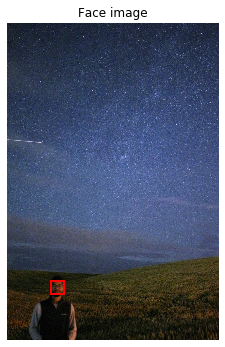

{'r': 774, 'c': 131, 'width': 40, 'height': 40}


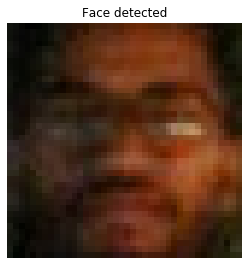

The detector found the face even when it's very small and pixelated. Ideally we would want a well-illuminated 
image.


In [62]:
# Is someone there?

night_image = plt.imread(data_folder + "face_det3.jpg")

from skimage.feature import Cascade

# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with min and max size of searching window
detected = detector.detect_multi_scale(img = night_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))

# Show the detected faces
print("""the show_detected_face() function which is used to display the face marked in the image and crop it so it can be 
shown separately.\n""")

show_detected_face(night_image, detected)

print("""The detector found the face even when it's very small and pixelated. Ideally we would want a well-illuminated 
image.""")

Exercício 9

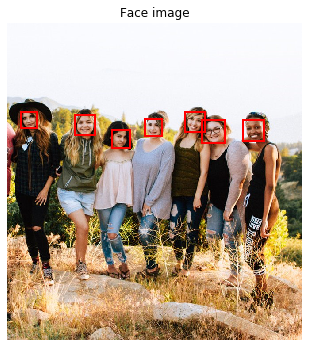

{'r': 202, 'c': 31, 'width': 36, 'height': 36}
{'r': 207, 'c': 152, 'width': 47, 'height': 47}
{'r': 217, 'c': 311, 'width': 39, 'height': 39}
{'r': 242, 'c': 237, 'width': 41, 'height': 41}
{'r': 202, 'c': 402, 'width': 45, 'height': 45}
{'r': 219, 'c': 533, 'width': 48, 'height': 48}
{'r': 218, 'c': 440, 'width': 52, 'height': 52}


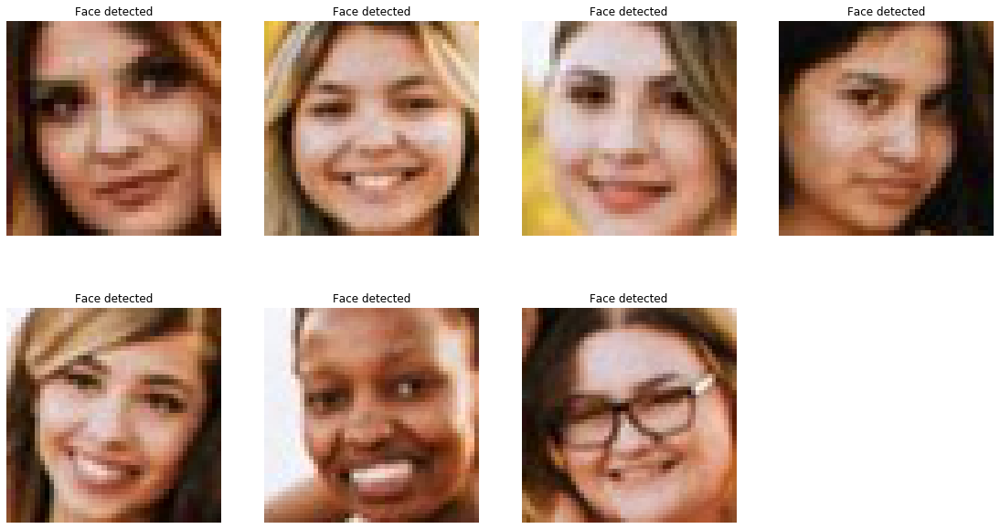

In [63]:
# Multiple faces

friends_image = plt.imread(data_folder + "face_det_friends22.jpg")

# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with scale factor to 1.2 and step ratio to 1
detected = detector.detect_multi_scale(img=friends_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
# Show the detected faces
show_detected_face(friends_image, detected)


Exercício 10

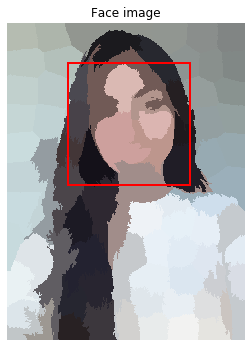

{'r': 110, 'c': 169, 'width': 340, 'height': 340}


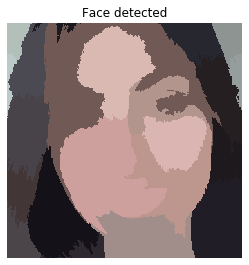

You applied segementation to the image before passing it to the face detector and it's finding the face even when
the image is relatively large.
This time you used 1000 by 1000 pixels as the maximum size of the searching window because the face in this case was indeed 
rather large, in comparison to the image.


In [64]:
# Segmentation and face detection

# Previously, you learned how to make processes more computationally efficient with unsupervised superpixel segmentation. 
# In this exercise, you'll do just that.
# Using the slic() function for segmentation, pre-process the image before passing it to the face detector.

profile_image = plt.imread(data_folder + "face_det9.jpg")

# Obtain the segmentation with default 100 regions
segments = slic(profile_image, n_segments=100)

# Obtain segmented image using label2rgb
segmented_image = label2rgb(segments, profile_image, kind='avg')

# Detect the faces with multi scale method
detected = detector.detect_multi_scale(img=segmented_image, 
                                       scale_factor=1.2, 
                                       step_ratio=1, 
                                       min_size=(10, 10), max_size=(1000, 1000))

# Show the detected faces
show_detected_face(segmented_image, detected)

print("""You applied segementation to the image before passing it to the face detector and it's finding the face even when
the image is relatively large.
This time you used 1000 by 1000 pixels as the maximum size of the searching window because the face in this case was indeed 
rather large, in comparison to the image.""")

#### Exercício 11 - Real-world applications

Privacy protection:


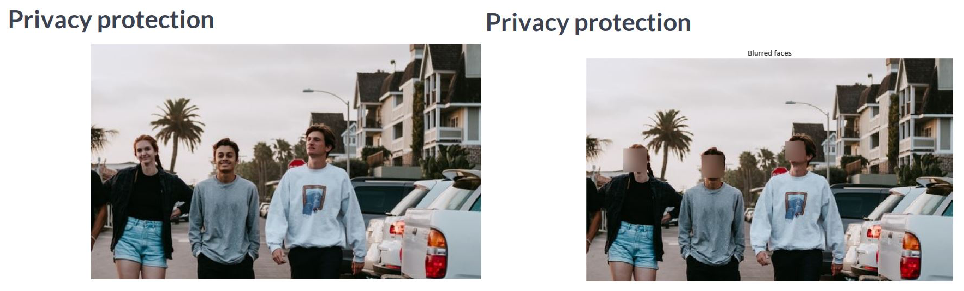

In [65]:
#vídeo

# Privacy protection
print("Privacy protection:")

image = plt.imread(data_folder + "privacy1.jpg")
plot_2('privacy1', 'privacy2')

In [66]:
# Import Cascade of classifiers and gaussian filter
from skimage.feature import Cascade
from skimage.filters import gaussian

def getFace(d, image):
    ''' Extracts the face rectangle from the image using the coordinates of the detected.'''
    # X and Y starting points of the face rectangle
    x, y = d['r'], d['c']
    # The width and height of the face rectangle
    width, height = d['r'] + d['width'], d['c'] + d['height']
    # Extract the detected face
    face = image[x:width, y:height]
    return face

def mergeBlurryFace(original, gaussian_image):
    # X and Y starting points of the face rectangle
    x, y = d['r'], d['c']
    # The width and height of the face rectangle
    width, height = d['r'] + d['width'], d['c'] + d['height']
    original = original.copy()
    original[x:width, y:height] = gaussian_image
    return original


Exercício 12

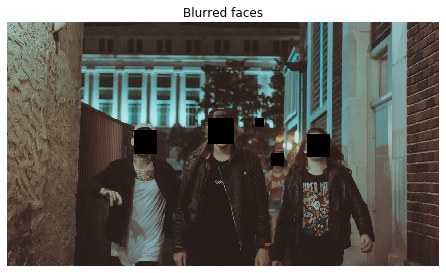

In [67]:
# Privacy protection

group_image = plt.imread(data_folder + "face_det25.jpg")

# Detect the faces
detected = detector.detect_multi_scale(img=group_image, 
                                       scale_factor=1.2, step_ratio=1, 
                                       min_size=(10, 10), max_size=(100, 100))

# For each detected face
resulting_image = group_image

for d in detected:  
    # Obtain the face rectangle from detected coordinates
    face = getFace(d, group_image)
    
    # Apply gaussian filter to extracted face
    blurred_face = gaussian(face, multichannel=True, sigma = 8)
    
    # Merge this blurry face to our final image and show it
    resulting_image = mergeBlurryFace(resulting_image, blurred_face) 

show_image(resulting_image, "Blurred faces")

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
plt.show()

Exercício 13

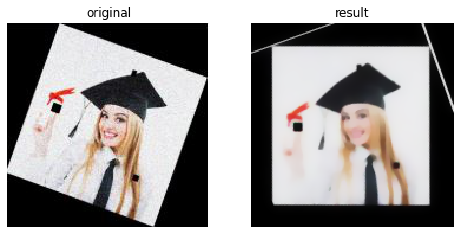

In [68]:
# Help Sally restore her graduation photo

damaged_image = plt.imread(data_folder + "sally1.jpg")

# Import the necessary modules
from skimage.restoration import denoise_tv_chambolle, inpaint
from skimage import transform

# Transform the image so it's not rotated
upright_img = rotate(damaged_image, 20)

# Remove noise from the image, using the chambolle method
upright_img_without_noise = denoise_tv_chambolle(upright_img,weight=0.1, multichannel=True)

# Reconstruct the image missing parts
mask = get_mask(upright_img)
result = inpaint.inpaint_biharmonic(upright_img_without_noise, mask, multichannel=True)

plot_comparison(damaged_image, result, 'result')


#### Exercício 14 - end

In [69]:
#vídeo

# Fim